In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import itertools
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Dense, Flatten, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.initializers import GlorotUniform
import random as python_random
import math

np.random.seed(42)
python_random.seed(42)
tf.random.set_seed(42)

2024-06-17 02:08:06.045244: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-17 02:08:06.065799: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-17 02:08:06.065815: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-17 02:08:06.066367: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-17 02:08:06.069881: I tensorflow/core/platform/cpu_feature_guar

### 1. Carga de datos

In [2]:
def load_data(filepath):
    return pd.read_csv(filepath, parse_dates=['Date'])

### 2. Division y tratamiento de datos

In [3]:
def create_sequences(data, target, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:(i + n_steps)])
        y.append(target[i + n_steps])
    return np.array(X), np.array(y)

In [4]:
def modify_data(data):
    result = None
    # print(data)

    # copy LMCADY_acu_5d_log into a new column ACU_5D and shift it by 5 days
    data['ACU_5D'] = data['LMCADY_acu_5d_log']
    data['ACU_5D'] = data['ACU_5D'].shift(5)
    
    # data['ACU_5D_alt'] = data['LMCADY'].rolling(window=5).sum()
    data['ACU_4D'] = data['LMCADY'].rolling(window=4).sum()
    data['ACU_3D'] = data['LMCADY'].rolling(window=3).sum()
    data['ACU_2D'] = data['LMCADY'].rolling(window=2).sum()

    data.dropna(inplace=True)
    data.reset_index(drop=True, inplace=True)

    result = data
    # print(result.head(10))
    return result

In [5]:
def prepare_data(df, target_column, n_steps, feature_list):
    df = modify_data(df)

    features = df.drop(columns=['LMCADY_std_5d_log', 'Date'])
    features.to_csv('../output/features_and_target_cnn.csv', index=False)
    features = features.drop(columns=[target_column])
    features = features[feature_list]
    print(features.head(5))  # Mostrar las primeras 5 filas de las características

    target = df[target_column]

    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    
    X, y = create_sequences(features_scaled, target, n_steps)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, shuffle=False)
    return X_train, X_test, y_train, y_test

In [6]:
# df = load_data("./input/copper_log_returns_5d_final.csv")
# # df

In [7]:
# Preparación de los datos
# X_train, X_test, y_train, y_test = prepare_data(df, 'LMCADY_acu_5d_log', 10)

In [8]:
# df = load_data("./input/copper_log_returns_5d_final.csv")
# # print(f"\n{i}) Testing with n_steps={n_steps}, batch_size={batch_size}, epochs={epochs}, filters={filters}")
# n_steps = 10
# # Preparación de los datos
# X_train, X_test, y_train, y_test = prepare_data(df, 'LMCADY_acu_5d_log', n_steps)

### 3. Arquitectura y compilacion

In [9]:
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

In [10]:
def build_model(input_shape, md_prm: dict):
    model = Sequential([
        Conv1D(filters=md_prm['filters']*2, kernel_size=md_prm['kernel_size'], activation=md_prm['activation'], input_shape=input_shape),
        BatchNormalization(),
        Conv1D(filters=md_prm['filters'], kernel_size=md_prm['kernel_size'], activation=md_prm['activation']),
        MaxPooling1D(pool_size=md_prm['pool_size']),
        Dropout(md_prm['dropout']),
        Flatten(),
        Dense(md_prm['dense_units']*2, activation=md_prm['dense_activation']),
        Dropout(md_prm['dropout']/2),
        Dense(md_prm['dense_units'], activation=md_prm['dense_activation']),
        Dense(1, activation="linear")
    ])
    model.compile(
        # optimizer=Adam(learning_rate=0.0001), 
        optimizer=Adam(learning_rate=0.000075), 
        loss='huber', 
        # loss = rmse,
        metrics=[rmse])
    return model

### 4. Entrenamiento del modelo

In [11]:
def train_model(model, X_train, y_train, epochs, batch_size, verbose):
    early_stopping = EarlyStopping(
        monitor             ='val_loss',
        patience            =10,
        verbose             =1,
        restore_best_weights=True
    )
    history = model.fit(
        X_train, y_train,
        epochs          =epochs,
        batch_size      =batch_size,
        verbose         =verbose,
        validation_split=0.05,
        callbacks       =[early_stopping]
    )
    return history

### 5. Evaluacion de resultado

In [12]:
def evaluate_model(model, X_test, y_test):
    loss = model.evaluate(X_test, y_test)
    print(f'Test Loss: {loss}')

In [13]:
def plot_history(history):
    # plotear loss de entrenamiento y validación
    figsize = (8,2)

    plt.figure(figsize=figsize)
    plt.plot(history.history['loss'], label='Training loss')
    plt.plot(history.history['val_loss'], label='Validation loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    plt.grid(True)
    plt.show()

    # otras metricas
    for key in history.history.keys():
        if key not in ['loss', 'val_loss', 'val_rmse']:
            plt.figure(figsize=figsize)
            plt.plot(history.history[key], label=f'Training {key}')
            plt.plot(history.history[f'val_{key}'], label=f'Validation {key}')
            plt.title(f'Model {key.capitalize()}')
            plt.ylabel(key.capitalize())
            plt.xlabel('Epoch')
            plt.legend()
            plt.grid(True)
            plt.show()

In [14]:
def plot_predictions(y_true, y_pred, n=-1, title="Prediction vs Actual Data", markersize=3, rmse=None):
    if n != -1:
        n = min(n, len(y_true), len(y_pred))

        y_true = y_true[-n:]
        y_pred = y_pred[-n:]

    plt.figure(figsize=(18, 2.5))
    plt.plot(y_true, label='Actual Values', marker='o', linestyle='-', markersize=markersize)

    # Plot the RMSE lines if rmse is provided
    if rmse is not None:
        plt.axhline(y= rmse, color='green', linestyle='--', linewidth=0.7)
        plt.axhline(y=-rmse, color='green', linestyle='--', linewidth=0.7)

        tot_pred = 0
        prof = 0
        loss = 0

        # plot green markers beyond the rmse range
        for i in range(len(y_pred)):
            if (y_pred[i] > rmse or y_pred[i] < - rmse):
                # print("{} {}".format(y_pred[i],y_true[i]))
                if (y_true[i] > 0 and y_pred[i] > 0) or (y_true[i] < 0 and y_pred[i] < 0):
                    plt.plot(i, y_pred[i], 'gx', markersize=markersize+1)
                    prof += 1
                else:
                    plt.plot(i, y_pred[i], 'rx', markersize=markersize+1)
                    loss += 1
                tot_pred += 1
            else:
                plt.plot(i, y_pred[i], marker='x', color='orange', markersize=markersize-1)

    else:
        plt.plot(y_true, label='Actual Values'   , marker='o', linestyle='-' , markersize=markersize)
        plt.plot(y_pred, label='Predicted Values', marker='x', linestyle='--', markersize=markersize)
        tot_pred = 0
        prof = 0
        loss = 0

    plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.7)

    plt.title(title)
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

    return tot_pred, prof, loss

In [15]:
def trend_accuracy(y_true, y_pred):
    trend_up_true = 0
    trend_down_true = 0
    trend_up_pred = 0
    trend_down_pred = 0

    for j in range(len(y_true)-1):
        if y_true[j] > 0.0:
            trend_up_pred += 1
            if y_pred[j] > 0.0:
                trend_up_true += 1
        if y_true[j] < 0.0:
            trend_down_pred += 1
            if y_pred[j] < 0.0:
                trend_down_true += 1

    trend_true = trend_up_true + trend_down_true
    trend_pred = trend_up_pred + trend_down_pred

    trend_up_accuracy = trend_up_true/trend_up_pred
    trend_down_accuracy = trend_down_true/trend_down_pred
    trend_accuracy = trend_true/trend_pred

    return trend_accuracy, trend_up_accuracy, trend_down_accuracy

In [16]:
# df = load_data("./input/copper_log_returns_5d_final.csv")
# n_steps = 25
# target_column = 'LMCADY_acu_5d_log'
# X_train, X_test, y_train, y_test = prepare_data(df, target_column, n_steps)
# y_test.std()
# model = build_model(X_train.shape[1:])
# history = train_model(model, X_train, y_train, epochs=100, batch_size=16)
# evaluate_model(model, X_test, y_test)

In [17]:
n_steps_options     = [100]
batch_size_options  = [16]
epochs_options      = [100]

filters_options             = [256]
kernel_size_options         = [2,3]
pool_size_options           = [2,3,4]
dense_units_options         = [100]
dense_activation_options    = ['tanh','relu']
activation_options          = ['tanh','relu']
dropout_options             = [0.15]

# variable_options = ['LMCADS03','LMCADY','SPX','MXWD','XAU','XAG','ACU_5D','ACU_4D','ACU_3D','ACU_2D']
# modified_lists = [variable_options[:i] + variable_options[i+1:] for i in range(len(variable_options))]
modified_lists = [['LMCADS03','LMCADY','SPX','MXWD','XAU','XAG','ACU_5D','ACU_4D','ACU_3D','ACU_2D']]

model_params_combinations = list(itertools.product(
    filters_options, 
    kernel_size_options, 
    pool_size_options, 
    dense_units_options,
    dense_activation_options, 
    activation_options, 
    dropout_options
))
target_column = 'LMCADY_acu_5d_log'

In [18]:
# number of iterations
n_iterations = len(n_steps_options) * len(batch_size_options) * len(epochs_options) * len(model_params_combinations) * len(modified_lists)
print(f'Total iterations: {n_iterations}')

Total iterations: 24


In [19]:
def run_model_iterations():
    top_results = []
    i = 1
    for n_steps, batch_size, epochs, (filters, kernel_size, pool_size, dense_units, dense_activation, activation, dropout), var_options in itertools.product(
            n_steps_options, batch_size_options, epochs_options, model_params_combinations, modified_lists):
        try:

            # data load
            df = load_data("../input/copper_log_returns_5d_final.csv")
            print("\nIteration {}/{}".format(i, n_iterations))
            # print("Params: n_steps: {}, lstm_units1: {}, lstm_units2: {}, activation: {}, dropout: {}, num_layers: {}".format(
            #     n_steps, lstm_units1, lstm_units2, activation, dropout, num_layers)
            # )

            print("Train : batch    > {}".format(batch_size))
            print("        epochs   > {}".format(epochs))
            print("        n_steps  > {}".format(n_steps))
            
            # data preparation
            # print("Variables used: {}".format(var_options))
            X_train, X_test, y_train, y_test = prepare_data(df, target_column, n_steps, var_options)

            # build model
            model_params = {
                'filters': filters,
                'kernel_size': kernel_size,
                'pool_size': pool_size,
                'dense_units': dense_units,
                'dense_activation': dense_activation,
                'activation': activation,
                'dropout': dropout
            }
            print("Model params: \n{}".format(model_params))

            input_shape = (X_train.shape[1], X_train.shape[2])
            print("Input shape: {}".format(input_shape))
            model = build_model(input_shape, model_params)
            print(model.summary())

            # model train
            if True:
                history = train_model(model, X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=2)

                # model evaluation
                y_pred      = model.predict(X_test)
                rmse_score  = math.sqrt(mean_squared_error(y_test, y_pred))
                std_dev     = np.std(y_test)

                print("Pred std dev: {:.6f}, test std dev: {:.6f}".format(np.std(y_pred), std_dev))

                if rmse_score < std_dev:
                    diff = rmse_score - std_dev + abs(np.std(y_pred) - std_dev)/4.0
                else:
                    diff = (rmse_score - std_dev) + abs(np.std(y_pred) - std_dev)/2.0

                # diff = (rmse_score - std_dev) + abs(np.std(y_pred) - std_dev)/2.0
                tren_acc, trend_up, trend_down = trend_accuracy(y_test, y_pred)
                result = {
                    'md_prm'    : model_params,
                    'n_steps'   : n_steps,
                    'batch_size': batch_size,
                    'epochs'    : epochs,
                    'rmse'      : rmse_score,
                    'std_dev'   : std_dev,
                    'diff'      : diff,
                    'predictions': y_pred,
                    'true_values': y_test,
                    'feature_list': var_options,
                    'tr_ac': tren_acc,
                    'tr_up': trend_up,
                    'tr_down': trend_down
                }

                # print("RMSE: {:.6f}, STD_DEV: {:.6f}, DIFF: {:.6f}".format(rmse_score, std_dev, diff))
                print("RMSE: {:.6f}, STD_DEV: {:.6f}, STD_PRD: {:.6f}, OBJDIFF: {:.6f}, RDIFF: {:.6f}".format(rmse_score, std_dev, np.std(y_pred), diff, (rmse_score - std_dev)))

                print("Trend: {:.2f}, Up: {:.2f}, Down: {:.2f}".format(tren_acc*100, trend_up*100, trend_down*100))

                top_results.append(result)
                top_results = sorted(top_results, key=lambda x: x['diff'])
                tot_pred, prof, loss = plot_predictions(result['true_values'], result['predictions'], -1, title="It. {}".format(i),rmse = rmse_score)
                print("Total TH Pred.: {}".format(tot_pred))
                if tot_pred != 0:
                    print("TH Pred. acc. : {:.2f}".format(prof*100.0/tot_pred))

            print("Completed Iteration {}/{}".format(i, n_iterations))
        except Exception as ex:
            print(f"An error occurred: {ex}. Skipping this combination.")
        i += 1
    return top_results


Iteration 1/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential"
_________________________________________________________________

2024-06-17 02:08:07.161537: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-17 02:08:07.179478: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-17 02:08:07.179621: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

308/308 - 12s - loss: 0.0303 - rmse: 0.1970 - val_loss: 0.0019 - val_rmse: 0.0595 - 12s/epoch - 38ms/step
Epoch 2/100
308/308 - 5s - loss: 0.0036 - rmse: 0.0831 - val_loss: 0.0011 - val_rmse: 0.0428 - 5s/epoch - 16ms/step
Epoch 3/100
308/308 - 5s - loss: 0.0019 - rmse: 0.0611 - val_loss: 6.5859e-04 - val_rmse: 0.0333 - 5s/epoch - 17ms/step
Epoch 4/100
308/308 - 5s - loss: 0.0014 - rmse: 0.0512 - val_loss: 6.1539e-04 - val_rmse: 0.0322 - 5s/epoch - 16ms/step
Epoch 5/100
308/308 - 5s - loss: 0.0011 - rmse: 0.0464 - val_loss: 6.3452e-04 - val_rmse: 0.0331 - 5s/epoch - 16ms/step
Epoch 6/100
308/308 - 5s - loss: 9.7656e-04 - rmse: 0.0430 - val_loss: 6.1486e-04 - val_rmse: 0.0324 - 5s/epoch - 16ms/step
Epoch 7/100
308/308 - 5s - loss: 9.1890e-04 - rmse: 0.0417 - val_loss: 5.9164e-04 - val_rmse: 0.0314 - 5s/epoch - 16ms/step
Epoch 8/100
308/308 - 5s - loss: 8.3045e-04 - rmse: 0.0398 - val_loss: 5.9560e-04 - val_rmse: 0.0317 - 5s/epoch - 16ms/step
Epoch 9/100
308/308 - 5s - loss: 7.8578e-04 - 

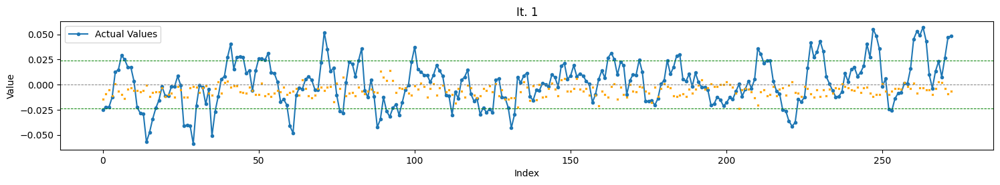

Total TH Pred.: 0
Completed Iteration 1/24

Iteration 2/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_1"
____________________

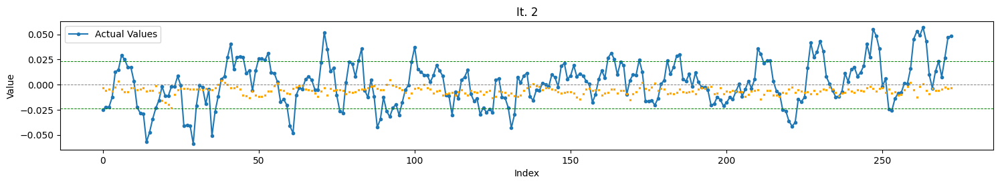

Total TH Pred.: 0
Completed Iteration 2/24

Iteration 3/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_2"
____________________

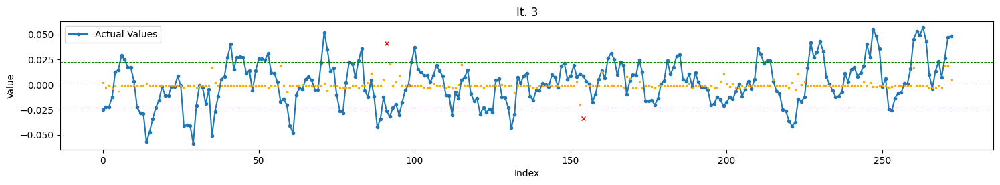

Total TH Pred.: 2
TH Pred. acc. : 0.00
Completed Iteration 3/24

Iteration 4/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_3"

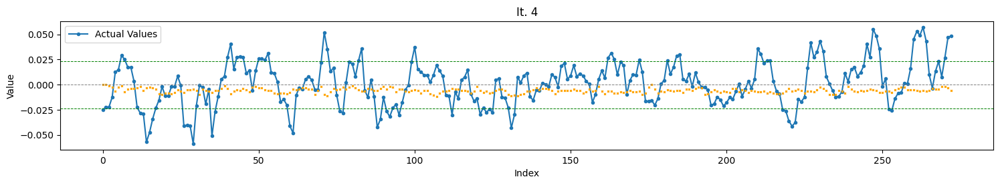

Total TH Pred.: 0
Completed Iteration 4/24

Iteration 5/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_4"
____________________

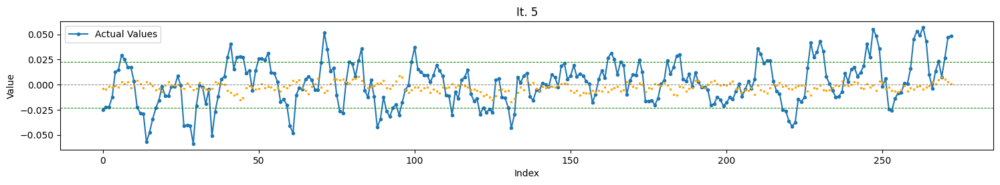

Total TH Pred.: 0
Completed Iteration 5/24

Iteration 6/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_5"
____________________

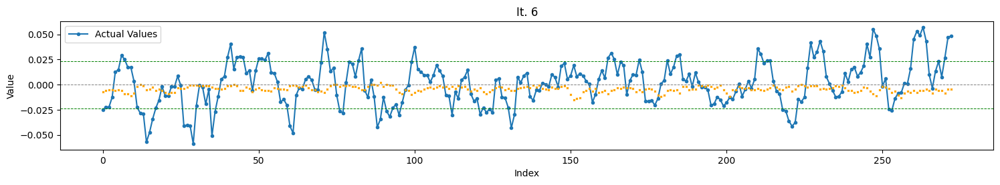

Total TH Pred.: 0
Completed Iteration 6/24

Iteration 7/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_6"
____________________

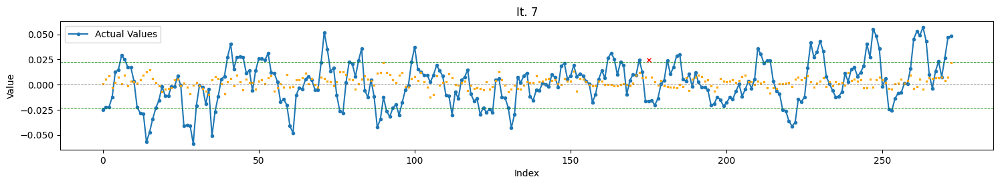

Total TH Pred.: 1
TH Pred. acc. : 0.00
Completed Iteration 7/24

Iteration 8/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_7"

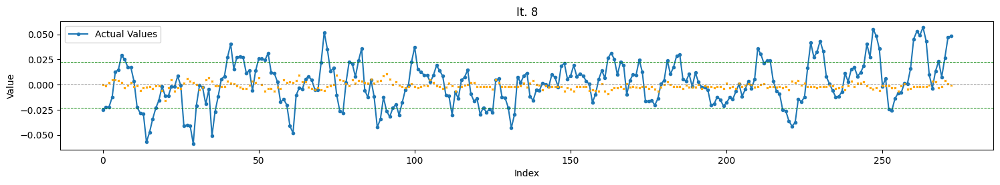

Total TH Pred.: 0
Completed Iteration 8/24

Iteration 9/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_8"
____________________

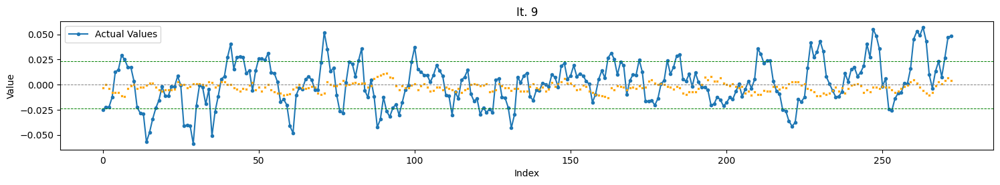

Total TH Pred.: 0
Completed Iteration 9/24

Iteration 10/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_9"
___________________

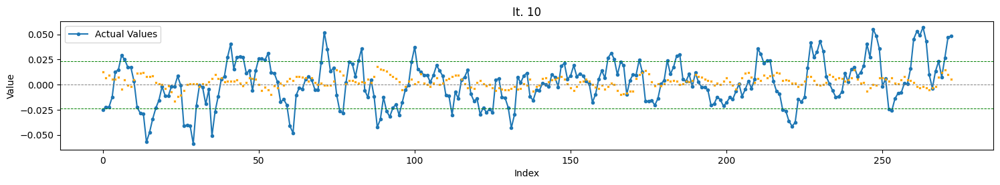

Total TH Pred.: 0
Completed Iteration 10/24

Iteration 11/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_10"
_________________

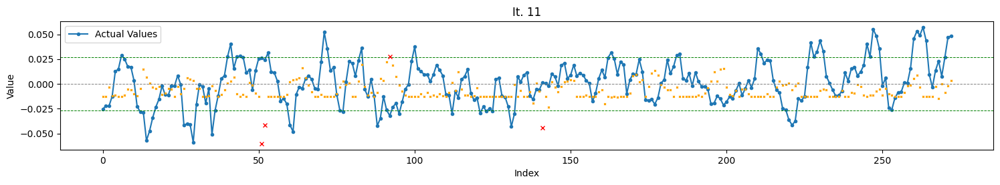

Total TH Pred.: 4
TH Pred. acc. : 0.00
Completed Iteration 11/24

Iteration 12/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_

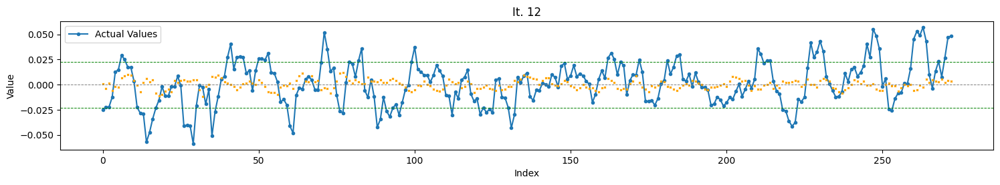

Total TH Pred.: 0
Completed Iteration 12/24

Iteration 13/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_12"
_________________

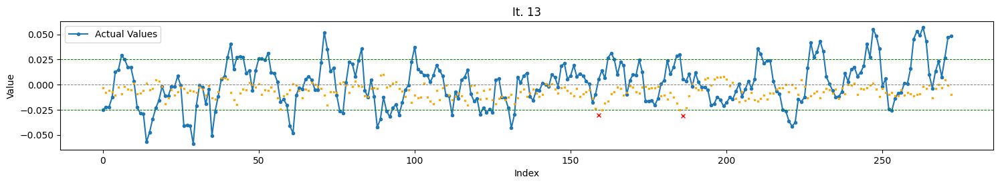

Total TH Pred.: 2
TH Pred. acc. : 0.00
Completed Iteration 13/24

Iteration 14/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_

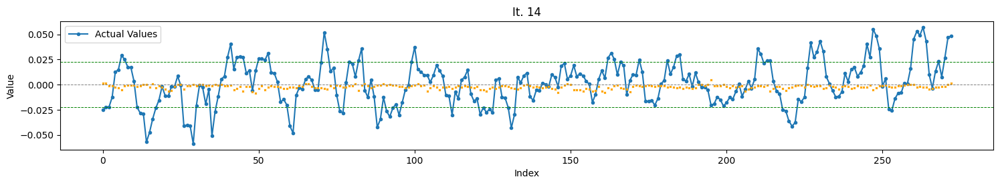

Total TH Pred.: 0
Completed Iteration 14/24

Iteration 15/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_14"
_________________

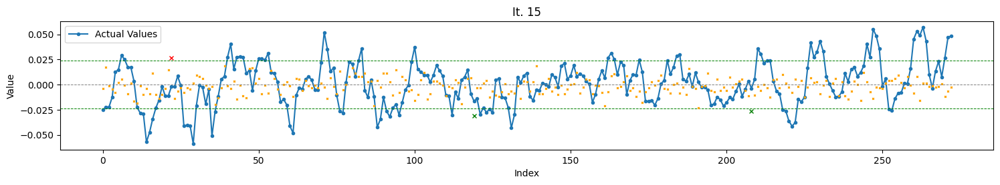

Total TH Pred.: 3
TH Pred. acc. : 66.67
Completed Iteration 15/24

Iteration 16/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential

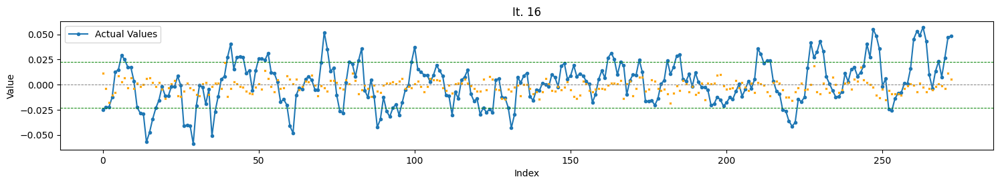

Total TH Pred.: 0
Completed Iteration 16/24

Iteration 17/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_16"
_________________

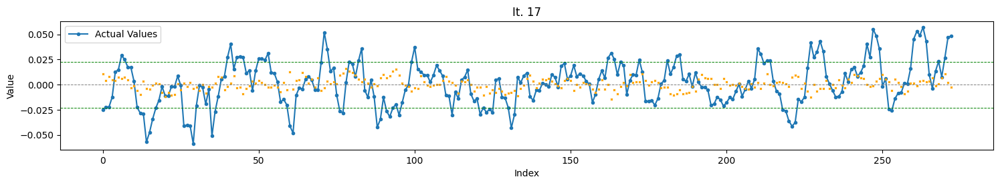

Total TH Pred.: 0
Completed Iteration 17/24

Iteration 18/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_17"
_________________

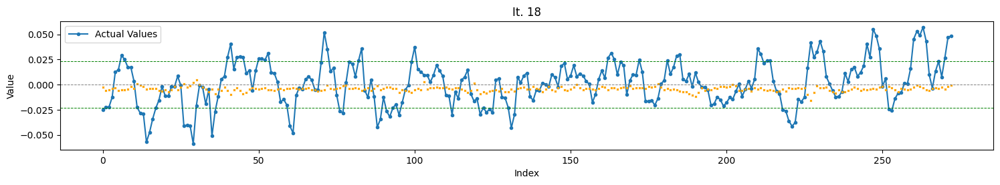

Total TH Pred.: 0
Completed Iteration 18/24

Iteration 19/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_18"
_________________

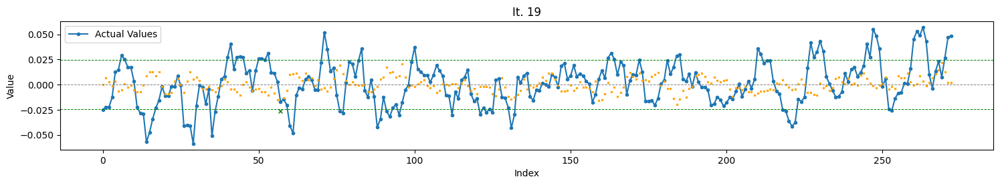

Total TH Pred.: 1
TH Pred. acc. : 100.00
Completed Iteration 19/24

Iteration 20/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequentia

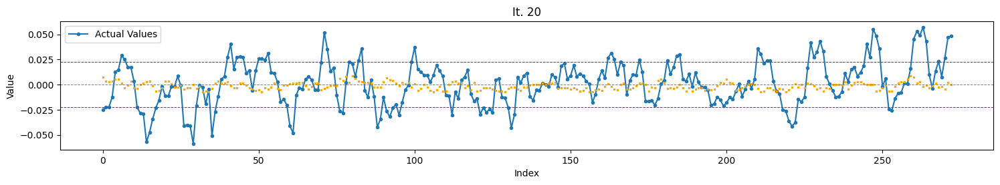

Total TH Pred.: 0
Completed Iteration 20/24

Iteration 21/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_20"
_________________

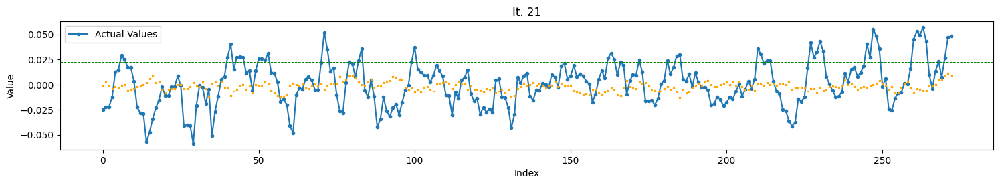

Total TH Pred.: 0
Completed Iteration 21/24

Iteration 22/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_21"
_________________

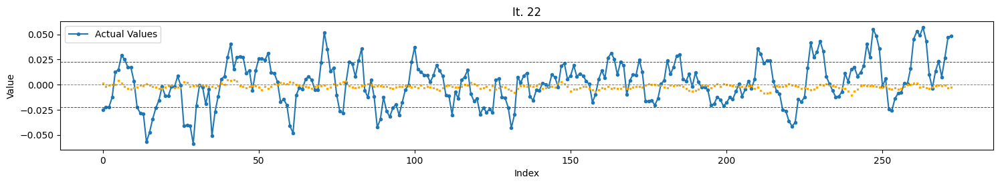

Total TH Pred.: 0
Completed Iteration 22/24

Iteration 23/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_22"
_________________

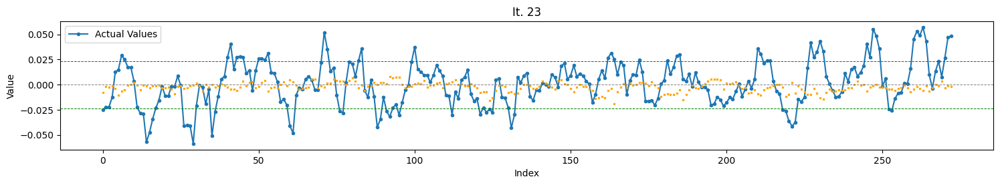

Total TH Pred.: 0
Completed Iteration 23/24

Iteration 24/24
Train : batch    > 16
        epochs   > 100
        n_steps  > 100
   LMCADS03    LMCADY       SPX      MXWD       XAU       XAG    ACU_5D  \
0  0.010936  0.011509  0.019211  0.014910 -0.002492 -0.002064  0.040542   
1 -0.010936 -0.011664 -0.000011  0.002825  0.005654  0.004741  0.015400   
2  0.007000  0.006463 -0.001413  0.000755 -0.000564 -0.006809  0.011601   
3  0.011160  0.010982  0.005813  0.007021 -0.009067 -0.014599  0.027062   
4  0.006577  0.006050 -0.014531 -0.010854 -0.001709  0.001050  0.023340   

     ACU_4D    ACU_3D    ACU_2D  
0  0.027064  0.016802  0.021281  
1  0.005138  0.009617 -0.000154  
2  0.016080  0.006308 -0.005201  
3  0.017291  0.005781  0.017445  
4  0.011831  0.023495  0.017032  
Model params: 
{'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Input shape: (100, 10)
Model: "sequential_23"
_________________

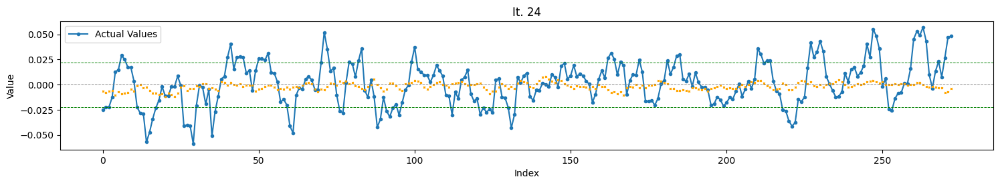

Total TH Pred.: 0
Completed Iteration 24/24


In [20]:
top_results_sort = run_model_iterations()

Top 1 - 0.5
RMSE: 0.022016, STD_DEV: 0.022020, STD_PRD: 0.003622, OBJDIFF: 0.004596, RDIFF: -0.000003
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022319, inv. diff> 0.009498
Trend accuracy       : 55.147
Trend up accuracy    : 41.379
Trend down accuracy  : 70.866


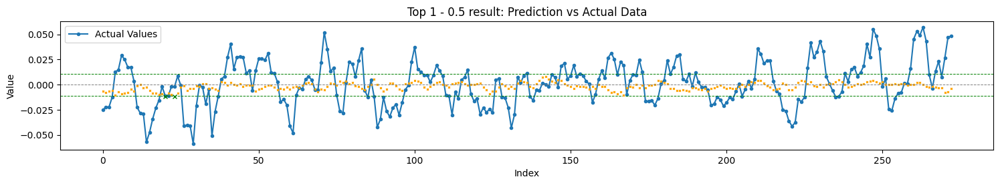

Total TH Pred.: 2
TH Pred. acc. : 100.00


Top 2 - 0.5
RMSE: 0.022751, STD_DEV: 0.022020, STD_PRD: 0.006281, OBJDIFF: 0.008601, RDIFF: 0.000731
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022910, inv. diff> 0.008759
Trend accuracy       : 51.838
Trend up accuracy    : 42.759
Trend down accuracy  : 62.205


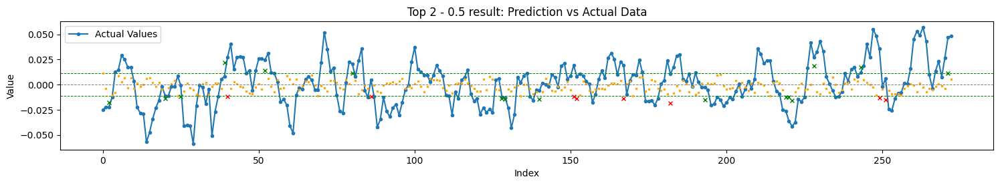

Total TH Pred.: 24
TH Pred. acc. : 66.67


Top 3 - 0.5
RMSE: 0.023870, STD_DEV: 0.022020, STD_PRD: 0.008442, OBJDIFF: 0.008639, RDIFF: 0.001850
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023587, inv. diff> 0.008356
Trend accuracy       : 47.426
Trend up accuracy    : 37.931
Trend down accuracy  : 58.268


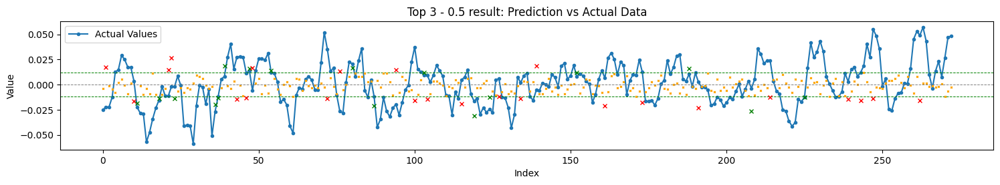

Total TH Pred.: 41
TH Pred. acc. : 41.46


Top 4 - 0.5
RMSE: 0.022764, STD_DEV: 0.022020, STD_PRD: 0.005383, OBJDIFF: 0.009063, RDIFF: 0.000744
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022999, inv. diff> 0.009298
Trend accuracy       : 54.779
Trend up accuracy    : 71.724
Trend down accuracy  : 35.433


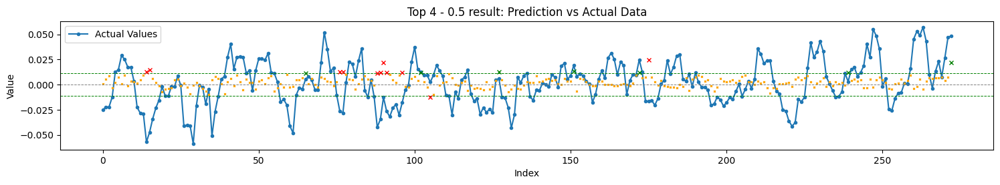

Total TH Pred.: 18
TH Pred. acc. : 38.89


Top 5 - 0.5
RMSE: 0.022941, STD_DEV: 0.022020, STD_PRD: 0.005698, OBJDIFF: 0.009082, RDIFF: 0.000921
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022817, inv. diff> 0.008959
Trend accuracy       : 50.000
Trend up accuracy    : 53.793
Trend down accuracy  : 45.669


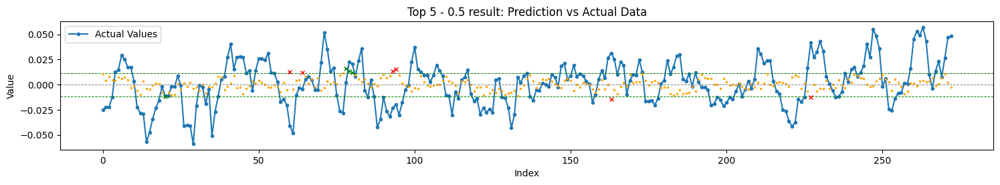

Total TH Pred.: 10
TH Pred. acc. : 40.00


Top 6 - 0.5
RMSE: 0.022848, STD_DEV: 0.022020, STD_PRD: 0.005163, OBJDIFF: 0.009256, RDIFF: 0.000828
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022659, inv. diff> 0.009068
Trend accuracy       : 43.750
Trend up accuracy    : 10.345
Trend down accuracy  : 81.890


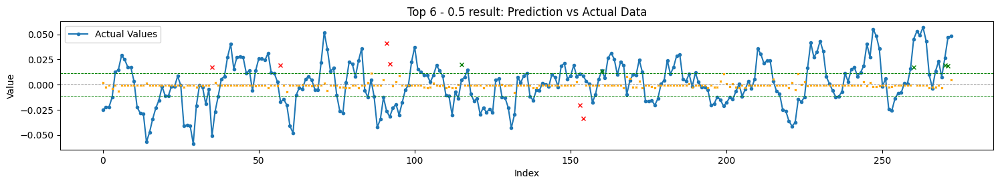

Total TH Pred.: 11
TH Pred. acc. : 45.45


Top 7 - 0.5
RMSE: 0.022997, STD_DEV: 0.022020, STD_PRD: 0.004565, OBJDIFF: 0.009705, RDIFF: 0.000977
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022538, inv. diff> 0.009246
Trend accuracy       : 49.632
Trend up accuracy    : 50.345
Trend down accuracy  : 48.819


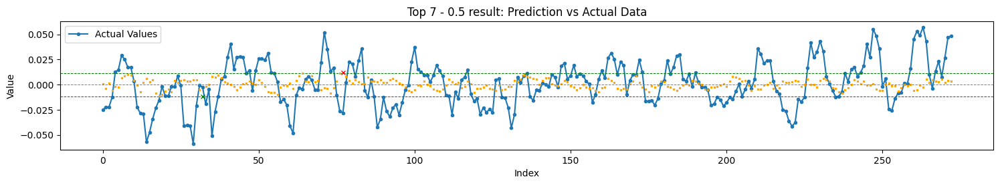

Total TH Pred.: 2
TH Pred. acc. : 50.00


Top 8 - 0.5
RMSE: 0.022556, STD_DEV: 0.022020, STD_PRD: 0.003536, OBJDIFF: 0.009778, RDIFF: 0.000536
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022302, inv. diff> 0.009524
Trend accuracy       : 45.588
Trend up accuracy    : 34.483
Trend down accuracy  : 58.268


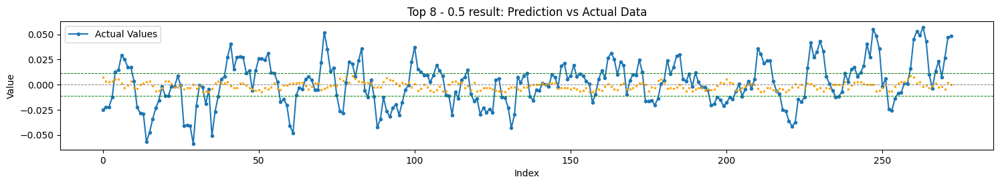

Total TH Pred.: 0


Top 9 - 0.5
RMSE: 0.022992, STD_DEV: 0.022020, STD_PRD: 0.004366, OBJDIFF: 0.009800, RDIFF: 0.000973
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022454, inv. diff> 0.009261
Trend accuracy       : 45.956
Trend up accuracy    : 31.724
Trend down accuracy  : 62.205


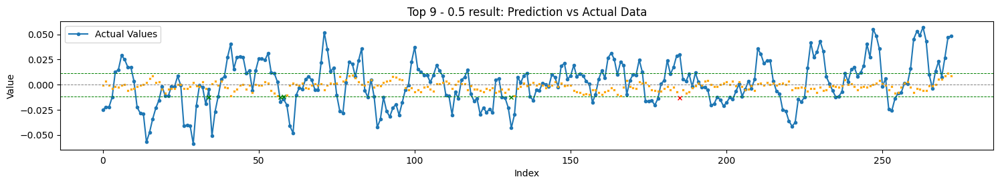

Total TH Pred.: 5
TH Pred. acc. : 80.00


Top 10 - 0.5
RMSE: 0.024462, STD_DEV: 0.022020, STD_PRD: 0.007277, OBJDIFF: 0.009814, RDIFF: 0.002442
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023224, inv. diff> 0.008576
Trend accuracy       : 41.912
Trend up accuracy    : 39.310
Trend down accuracy  : 44.882


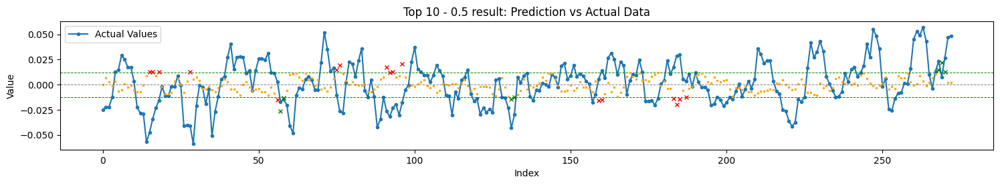

Total TH Pred.: 24
TH Pred. acc. : 29.17


Top 11 - 0.5
RMSE: 0.022981, STD_DEV: 0.022020, STD_PRD: 0.004304, OBJDIFF: 0.009819, RDIFF: 0.000961
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022466, inv. diff> 0.009304
Trend accuracy       : 45.588
Trend up accuracy    : 24.828
Trend down accuracy  : 69.291


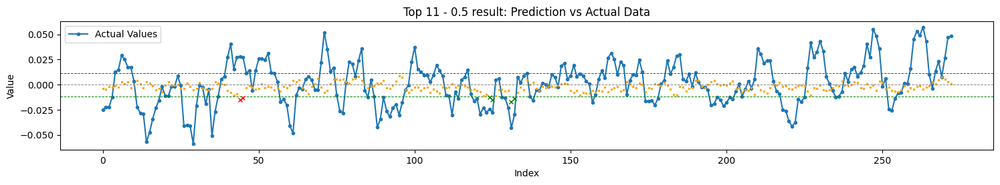

Total TH Pred.: 6
TH Pred. acc. : 66.67


Top 12 - 0.5
RMSE: 0.023610, STD_DEV: 0.022020, STD_PRD: 0.005396, OBJDIFF: 0.009903, RDIFF: 0.001591
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023033, inv. diff> 0.009325
Trend accuracy       : 47.794
Trend up accuracy    : 68.276
Trend down accuracy  : 24.409


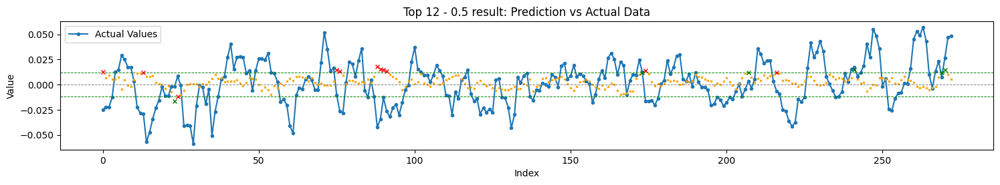

Total TH Pred.: 17
TH Pred. acc. : 35.29


Top 13 - 0.5
RMSE: 0.023374, STD_DEV: 0.022020, STD_PRD: 0.004506, OBJDIFF: 0.010111, RDIFF: 0.001354
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022502, inv. diff> 0.009239
Trend accuracy       : 44.485
Trend up accuracy    : 25.517
Trend down accuracy  : 66.142


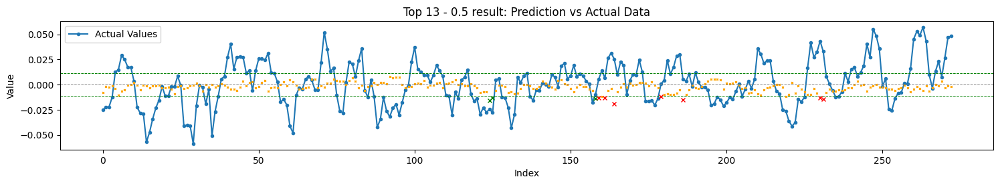

Total TH Pred.: 10
TH Pred. acc. : 30.00


Top 14 - 0.5
RMSE: 0.023967, STD_DEV: 0.022020, STD_PRD: 0.005485, OBJDIFF: 0.010215, RDIFF: 0.001948
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023128, inv. diff> 0.009376
Trend accuracy       : 47.794
Trend up accuracy    : 13.103
Trend down accuracy  : 87.402


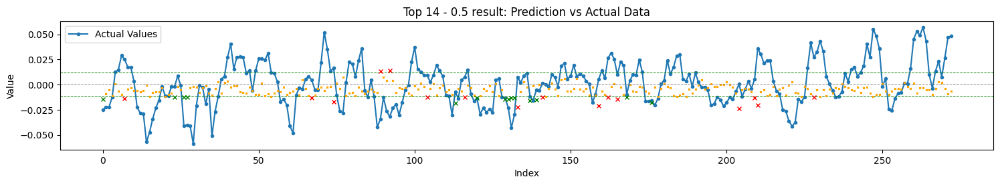

Total TH Pred.: 30
TH Pred. acc. : 46.67


Top 15 - 0.5
RMSE: 0.022910, STD_DEV: 0.022020, STD_PRD: 0.003322, OBJDIFF: 0.010239, RDIFF: 0.000890
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022271, inv. diff> 0.009600
Trend accuracy       : 44.853
Trend up accuracy    : 28.276
Trend down accuracy  : 63.780


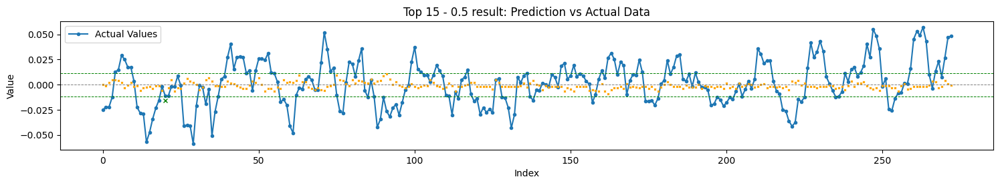

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 16 - 0.5
RMSE: 0.023627, STD_DEV: 0.022020, STD_PRD: 0.004347, OBJDIFF: 0.010444, RDIFF: 0.001608
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022481, inv. diff> 0.009297
Trend accuracy       : 41.176
Trend up accuracy    : 21.379
Trend down accuracy  : 63.780


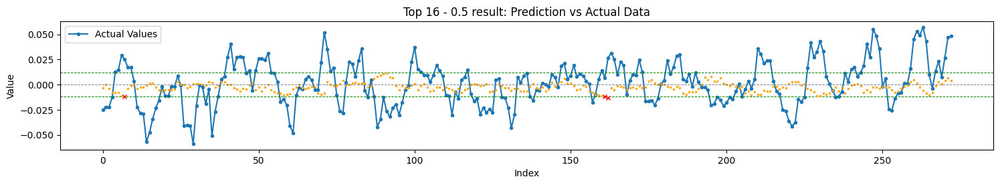

Total TH Pred.: 3
TH Pred. acc. : 0.00


Top 17 - 0.5
RMSE: 0.022574, STD_DEV: 0.022020, STD_PRD: 0.002225, OBJDIFF: 0.010451, RDIFF: 0.000554
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022140, inv. diff> 0.010017
Trend accuracy       : 45.588
Trend up accuracy    : 13.793
Trend down accuracy  : 81.890


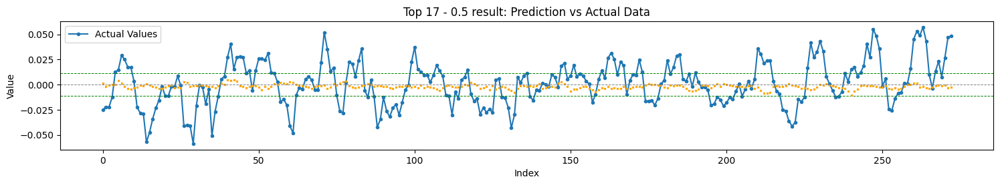

Total TH Pred.: 0


Top 18 - 0.5
RMSE: 0.022510, STD_DEV: 0.022020, STD_PRD: 0.001905, OBJDIFF: 0.010547, RDIFF: 0.000490
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022121, inv. diff> 0.010159
Trend accuracy       : 46.691
Trend up accuracy    : 7.586
Trend down accuracy  : 91.339


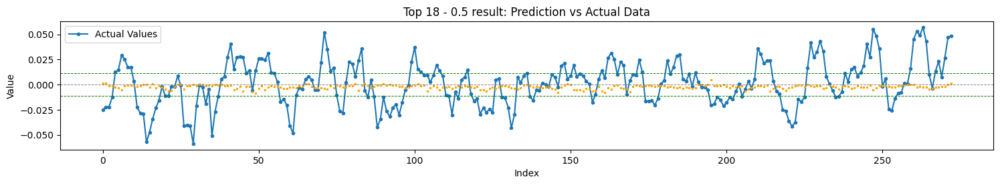

Total TH Pred.: 0


Top 19 - 0.5
RMSE: 0.023560, STD_DEV: 0.022020, STD_PRD: 0.003704, OBJDIFF: 0.010698, RDIFF: 0.001540
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022843, inv. diff> 0.009981
Trend accuracy       : 47.794
Trend up accuracy    : 5.517
Trend down accuracy  : 96.063


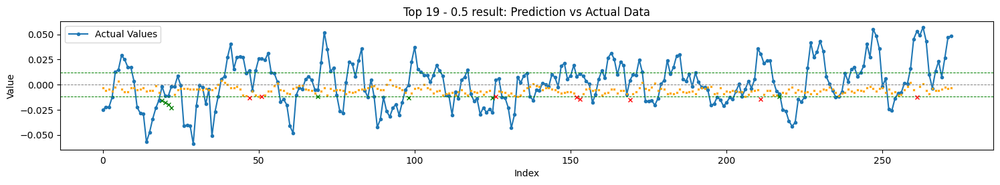

Total TH Pred.: 16
TH Pred. acc. : 50.00


Top 20 - 0.5
RMSE: 0.025242, STD_DEV: 0.022020, STD_PRD: 0.006816, OBJDIFF: 0.010825, RDIFF: 0.003223
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023693, inv. diff> 0.009275
Trend accuracy       : 44.118
Trend up accuracy    : 11.034
Trend down accuracy  : 81.890


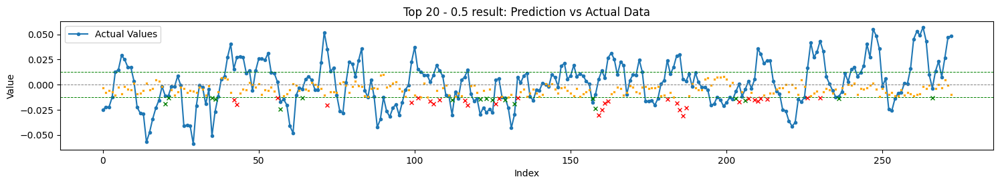

Total TH Pred.: 49
TH Pred. acc. : 36.73


Top 21 - 0.5
RMSE: 0.023026, STD_DEV: 0.022020, STD_PRD: 0.002252, OBJDIFF: 0.010890, RDIFF: 0.001006
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022331, inv. diff> 0.010195
Trend accuracy       : 44.853
Trend up accuracy    : 1.379
Trend down accuracy  : 94.488


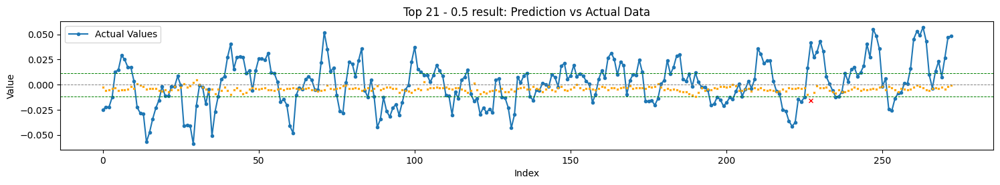

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 22 - 0.5
RMSE: 0.023461, STD_DEV: 0.022020, STD_PRD: 0.002853, OBJDIFF: 0.011025, RDIFF: 0.001441
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022420, inv. diff> 0.009984
Trend accuracy       : 45.588
Trend up accuracy    : 1.379
Trend down accuracy  : 96.063


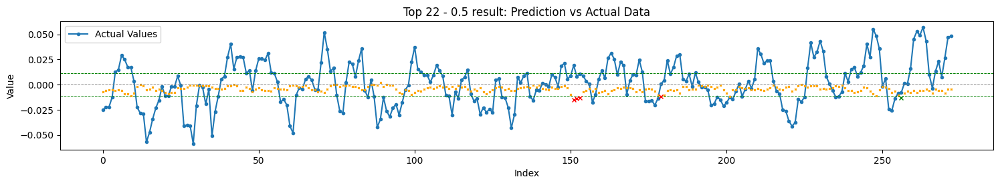

Total TH Pred.: 5
TH Pred. acc. : 20.00


Top 23 - 0.5
RMSE: 0.023334, STD_DEV: 0.022020, STD_PRD: 0.002256, OBJDIFF: 0.011196, RDIFF: 0.001315
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022606, inv. diff> 0.010468
Trend accuracy       : 45.588
Trend up accuracy    : 0.000
Trend down accuracy  : 97.638


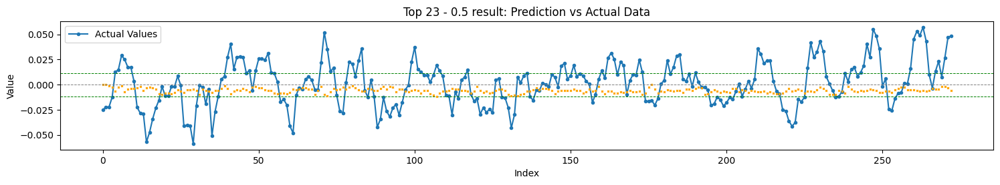

Total TH Pred.: 0


Top 24 - 0.5
RMSE: 0.026989, STD_DEV: 0.022020, STD_PRD: 0.009088, OBJDIFF: 0.011435, RDIFF: 0.004970
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.024486, inv. diff> 0.008932
Trend accuracy       : 42.279
Trend up accuracy    : 13.793
Trend down accuracy  : 74.803


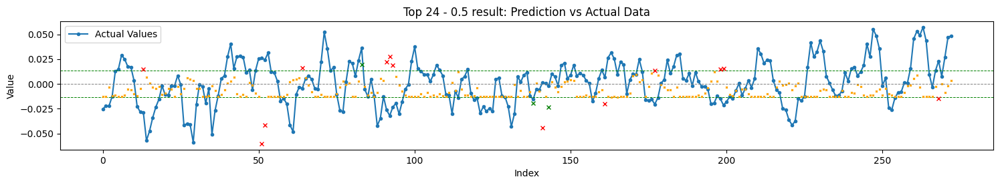

Total TH Pred.: 16
TH Pred. acc. : 18.75


Top 1 - 0.6
RMSE: 0.022016, STD_DEV: 0.022020, STD_PRD: 0.003622, OBJDIFF: 0.004596, RDIFF: -0.000003
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022319, inv. diff> 0.009498
Trend accuracy       : 55.147
Trend up accuracy    : 41.379
Trend down accuracy  : 70.866


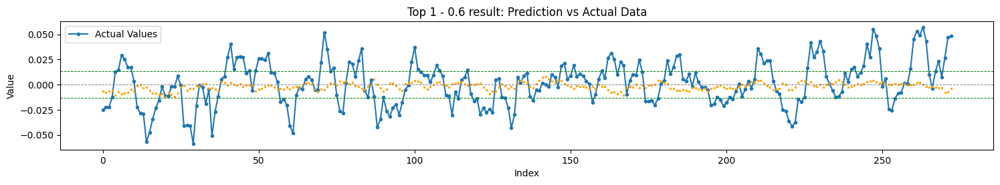

Total TH Pred.: 0


Top 2 - 0.6
RMSE: 0.022751, STD_DEV: 0.022020, STD_PRD: 0.006281, OBJDIFF: 0.008601, RDIFF: 0.000731
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022910, inv. diff> 0.008759
Trend accuracy       : 51.838
Trend up accuracy    : 42.759
Trend down accuracy  : 62.205


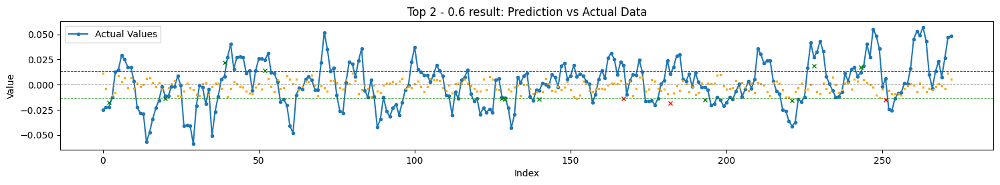

Total TH Pred.: 14
TH Pred. acc. : 78.57


Top 3 - 0.6
RMSE: 0.023870, STD_DEV: 0.022020, STD_PRD: 0.008442, OBJDIFF: 0.008639, RDIFF: 0.001850
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023587, inv. diff> 0.008356
Trend accuracy       : 47.426
Trend up accuracy    : 37.931
Trend down accuracy  : 58.268


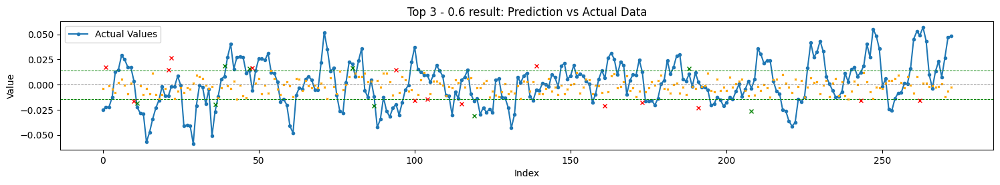

Total TH Pred.: 24
TH Pred. acc. : 37.50


Top 4 - 0.6
RMSE: 0.022764, STD_DEV: 0.022020, STD_PRD: 0.005383, OBJDIFF: 0.009063, RDIFF: 0.000744
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022999, inv. diff> 0.009298
Trend accuracy       : 54.779
Trend up accuracy    : 71.724
Trend down accuracy  : 35.433


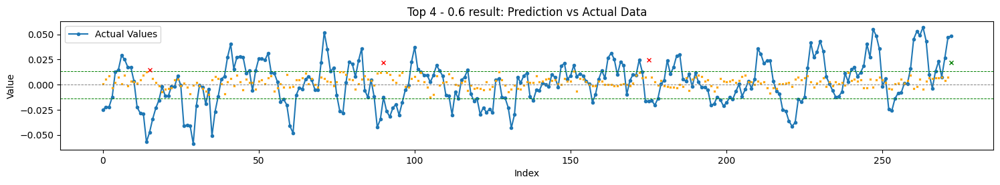

Total TH Pred.: 4
TH Pred. acc. : 25.00


Top 5 - 0.6
RMSE: 0.022941, STD_DEV: 0.022020, STD_PRD: 0.005698, OBJDIFF: 0.009082, RDIFF: 0.000921
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022817, inv. diff> 0.008959
Trend accuracy       : 50.000
Trend up accuracy    : 53.793
Trend down accuracy  : 45.669


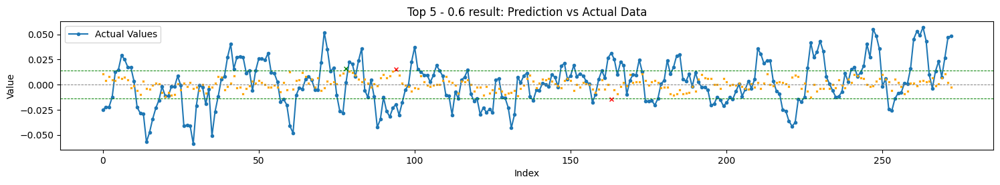

Total TH Pred.: 3
TH Pred. acc. : 33.33


Top 6 - 0.6
RMSE: 0.022848, STD_DEV: 0.022020, STD_PRD: 0.005163, OBJDIFF: 0.009256, RDIFF: 0.000828
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022659, inv. diff> 0.009068
Trend accuracy       : 43.750
Trend up accuracy    : 10.345
Trend down accuracy  : 81.890


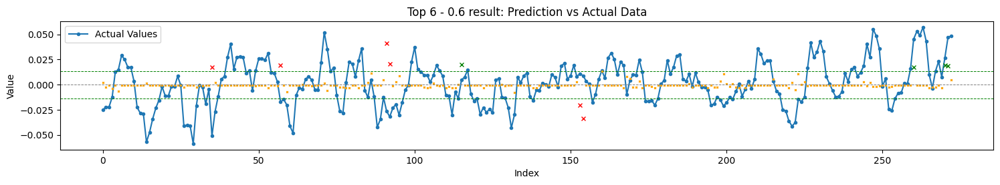

Total TH Pred.: 10
TH Pred. acc. : 40.00


Top 7 - 0.6
RMSE: 0.022997, STD_DEV: 0.022020, STD_PRD: 0.004565, OBJDIFF: 0.009705, RDIFF: 0.000977
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022538, inv. diff> 0.009246
Trend accuracy       : 49.632
Trend up accuracy    : 50.345
Trend down accuracy  : 48.819


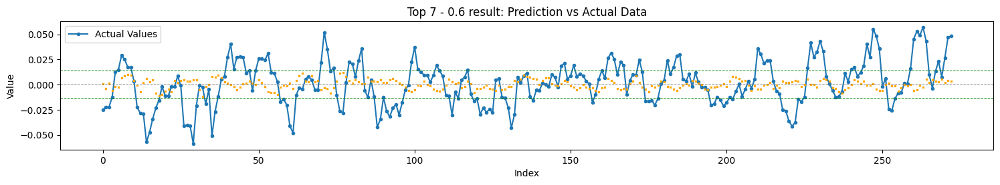

Total TH Pred.: 0


Top 8 - 0.6
RMSE: 0.022556, STD_DEV: 0.022020, STD_PRD: 0.003536, OBJDIFF: 0.009778, RDIFF: 0.000536
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022302, inv. diff> 0.009524
Trend accuracy       : 45.588
Trend up accuracy    : 34.483
Trend down accuracy  : 58.268


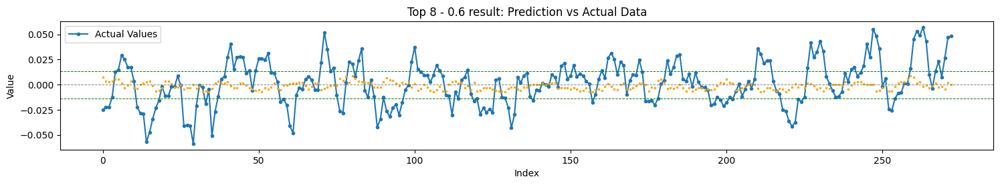

Total TH Pred.: 0


Top 9 - 0.6
RMSE: 0.022992, STD_DEV: 0.022020, STD_PRD: 0.004366, OBJDIFF: 0.009800, RDIFF: 0.000973
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022454, inv. diff> 0.009261
Trend accuracy       : 45.956
Trend up accuracy    : 31.724
Trend down accuracy  : 62.205


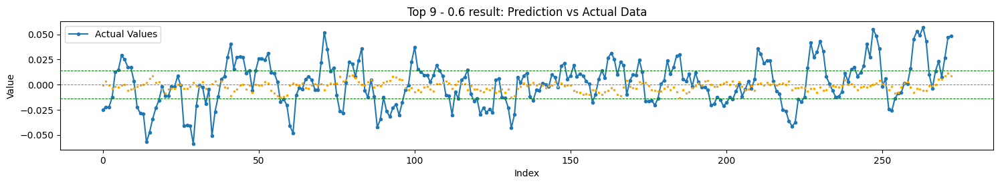

Total TH Pred.: 0


Top 10 - 0.6
RMSE: 0.024462, STD_DEV: 0.022020, STD_PRD: 0.007277, OBJDIFF: 0.009814, RDIFF: 0.002442
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023224, inv. diff> 0.008576
Trend accuracy       : 41.912
Trend up accuracy    : 39.310
Trend down accuracy  : 44.882


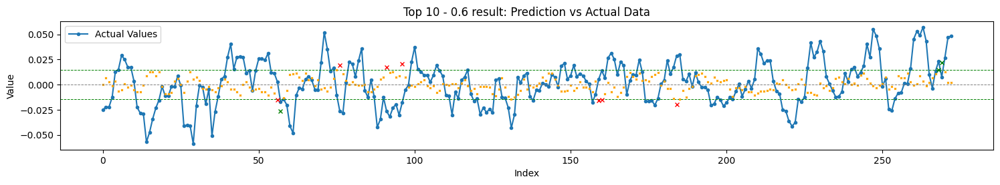

Total TH Pred.: 10
TH Pred. acc. : 30.00


Top 11 - 0.6
RMSE: 0.022981, STD_DEV: 0.022020, STD_PRD: 0.004304, OBJDIFF: 0.009819, RDIFF: 0.000961
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022466, inv. diff> 0.009304
Trend accuracy       : 45.588
Trend up accuracy    : 24.828
Trend down accuracy  : 69.291


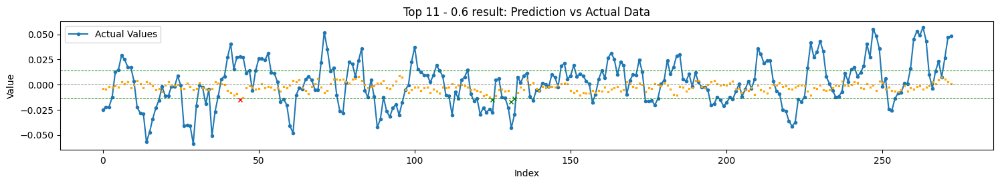

Total TH Pred.: 4
TH Pred. acc. : 75.00


Top 12 - 0.6
RMSE: 0.023610, STD_DEV: 0.022020, STD_PRD: 0.005396, OBJDIFF: 0.009903, RDIFF: 0.001591
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023033, inv. diff> 0.009325
Trend accuracy       : 47.794
Trend up accuracy    : 68.276
Trend down accuracy  : 24.409


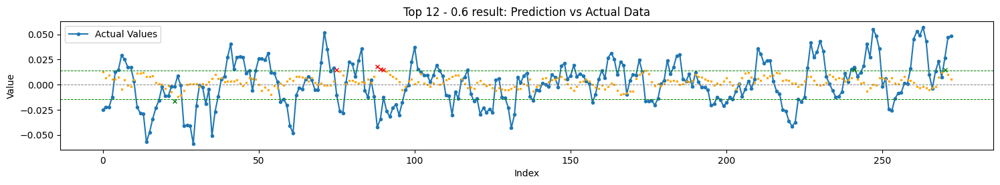

Total TH Pred.: 7
TH Pred. acc. : 42.86


Top 13 - 0.6
RMSE: 0.023374, STD_DEV: 0.022020, STD_PRD: 0.004506, OBJDIFF: 0.010111, RDIFF: 0.001354
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022502, inv. diff> 0.009239
Trend accuracy       : 44.485
Trend up accuracy    : 25.517
Trend down accuracy  : 66.142


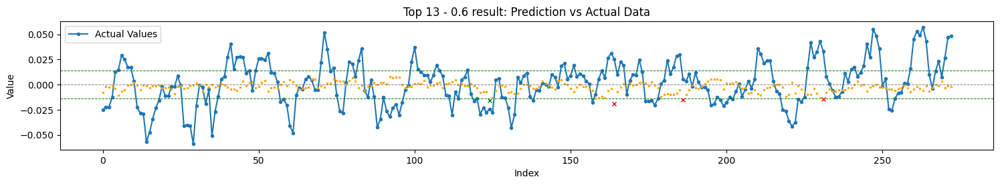

Total TH Pred.: 4
TH Pred. acc. : 25.00


Top 14 - 0.6
RMSE: 0.023967, STD_DEV: 0.022020, STD_PRD: 0.005485, OBJDIFF: 0.010215, RDIFF: 0.001948
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023128, inv. diff> 0.009376
Trend accuracy       : 47.794
Trend up accuracy    : 13.103
Trend down accuracy  : 87.402


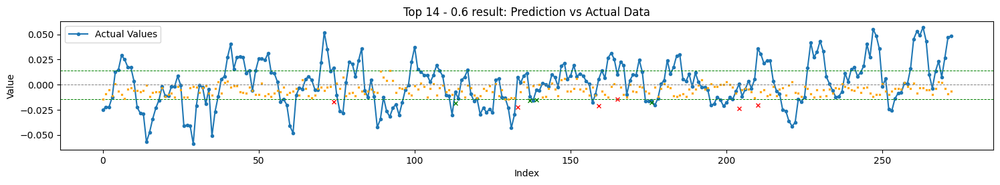

Total TH Pred.: 10
TH Pred. acc. : 40.00


Top 15 - 0.6
RMSE: 0.022910, STD_DEV: 0.022020, STD_PRD: 0.003322, OBJDIFF: 0.010239, RDIFF: 0.000890
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022271, inv. diff> 0.009600
Trend accuracy       : 44.853
Trend up accuracy    : 28.276
Trend down accuracy  : 63.780


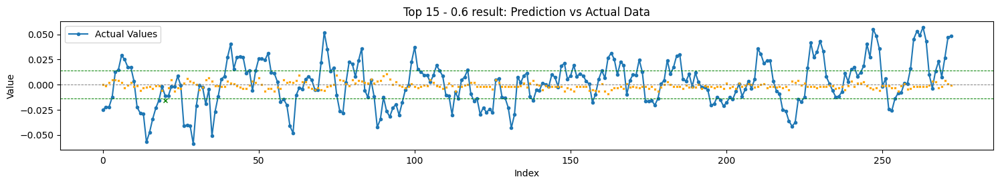

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 16 - 0.6
RMSE: 0.023627, STD_DEV: 0.022020, STD_PRD: 0.004347, OBJDIFF: 0.010444, RDIFF: 0.001608
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022481, inv. diff> 0.009297
Trend accuracy       : 41.176
Trend up accuracy    : 21.379
Trend down accuracy  : 63.780


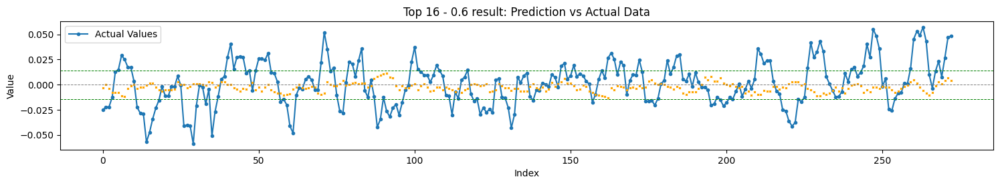

Total TH Pred.: 0


Top 17 - 0.6
RMSE: 0.022574, STD_DEV: 0.022020, STD_PRD: 0.002225, OBJDIFF: 0.010451, RDIFF: 0.000554
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022140, inv. diff> 0.010017
Trend accuracy       : 45.588
Trend up accuracy    : 13.793
Trend down accuracy  : 81.890


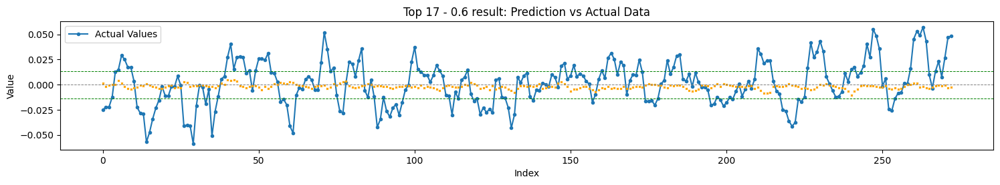

Total TH Pred.: 0


Top 18 - 0.6
RMSE: 0.022510, STD_DEV: 0.022020, STD_PRD: 0.001905, OBJDIFF: 0.010547, RDIFF: 0.000490
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022121, inv. diff> 0.010159
Trend accuracy       : 46.691
Trend up accuracy    : 7.586
Trend down accuracy  : 91.339


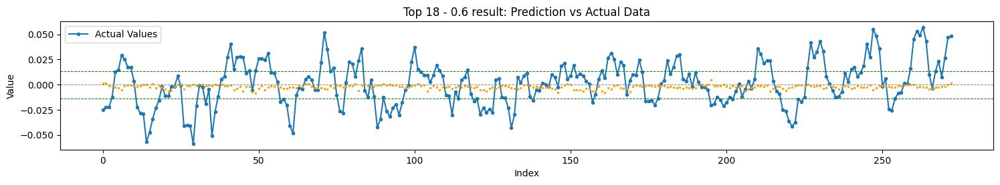

Total TH Pred.: 0


Top 19 - 0.6
RMSE: 0.023560, STD_DEV: 0.022020, STD_PRD: 0.003704, OBJDIFF: 0.010698, RDIFF: 0.001540
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022843, inv. diff> 0.009981
Trend accuracy       : 47.794
Trend up accuracy    : 5.517
Trend down accuracy  : 96.063


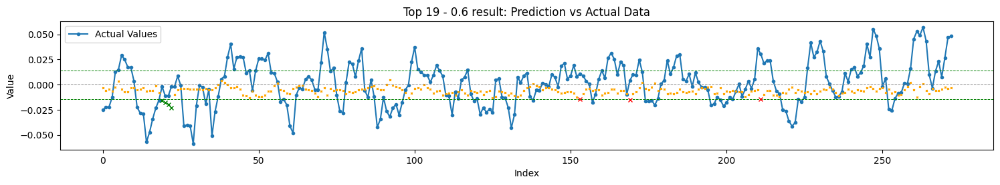

Total TH Pred.: 7
TH Pred. acc. : 57.14


Top 20 - 0.6
RMSE: 0.025242, STD_DEV: 0.022020, STD_PRD: 0.006816, OBJDIFF: 0.010825, RDIFF: 0.003223
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023693, inv. diff> 0.009275
Trend accuracy       : 44.118
Trend up accuracy    : 11.034
Trend down accuracy  : 81.890


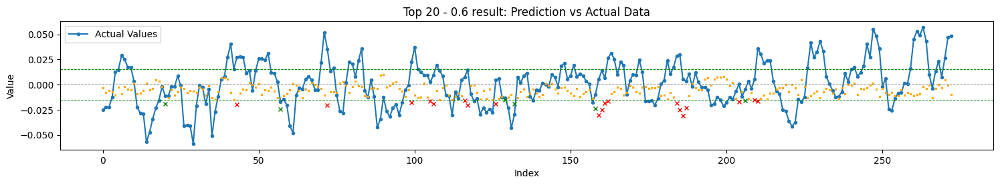

Total TH Pred.: 25
TH Pred. acc. : 24.00


Top 21 - 0.6
RMSE: 0.023026, STD_DEV: 0.022020, STD_PRD: 0.002252, OBJDIFF: 0.010890, RDIFF: 0.001006
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022331, inv. diff> 0.010195
Trend accuracy       : 44.853
Trend up accuracy    : 1.379
Trend down accuracy  : 94.488


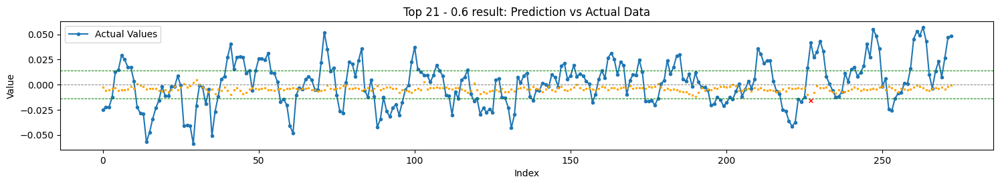

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 22 - 0.6
RMSE: 0.023461, STD_DEV: 0.022020, STD_PRD: 0.002853, OBJDIFF: 0.011025, RDIFF: 0.001441
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022420, inv. diff> 0.009984
Trend accuracy       : 45.588
Trend up accuracy    : 1.379
Trend down accuracy  : 96.063


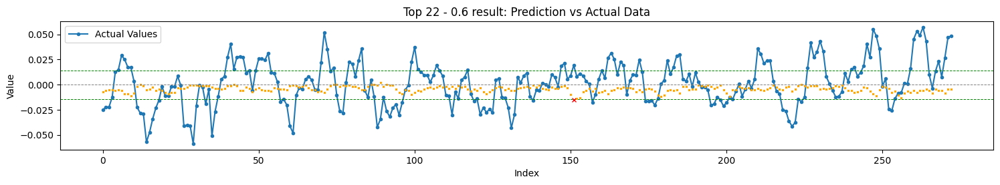

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 23 - 0.6
RMSE: 0.023334, STD_DEV: 0.022020, STD_PRD: 0.002256, OBJDIFF: 0.011196, RDIFF: 0.001315
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022606, inv. diff> 0.010468
Trend accuracy       : 45.588
Trend up accuracy    : 0.000
Trend down accuracy  : 97.638


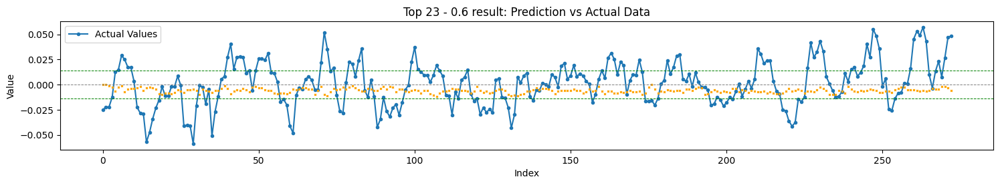

Total TH Pred.: 0


Top 24 - 0.6
RMSE: 0.026989, STD_DEV: 0.022020, STD_PRD: 0.009088, OBJDIFF: 0.011435, RDIFF: 0.004970
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.024486, inv. diff> 0.008932
Trend accuracy       : 42.279
Trend up accuracy    : 13.793
Trend down accuracy  : 74.803


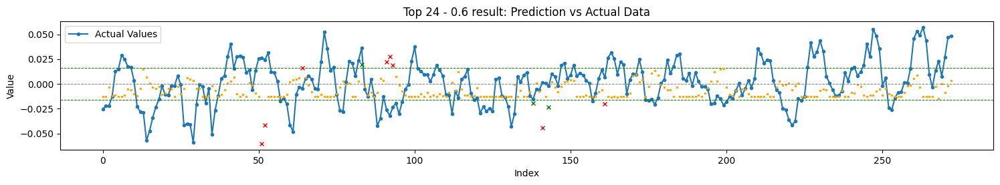

Total TH Pred.: 11
TH Pred. acc. : 27.27


Top 1 - 0.7
RMSE: 0.022016, STD_DEV: 0.022020, STD_PRD: 0.003622, OBJDIFF: 0.004596, RDIFF: -0.000003
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022319, inv. diff> 0.009498
Trend accuracy       : 55.147
Trend up accuracy    : 41.379
Trend down accuracy  : 70.866


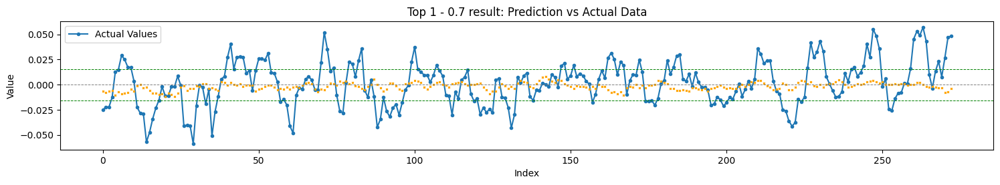

Total TH Pred.: 0


Top 2 - 0.7
RMSE: 0.022751, STD_DEV: 0.022020, STD_PRD: 0.006281, OBJDIFF: 0.008601, RDIFF: 0.000731
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022910, inv. diff> 0.008759
Trend accuracy       : 51.838
Trend up accuracy    : 42.759
Trend down accuracy  : 62.205


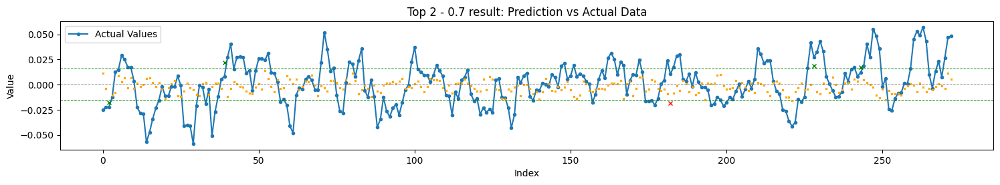

Total TH Pred.: 5
TH Pred. acc. : 80.00


Top 3 - 0.7
RMSE: 0.023870, STD_DEV: 0.022020, STD_PRD: 0.008442, OBJDIFF: 0.008639, RDIFF: 0.001850
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023587, inv. diff> 0.008356
Trend accuracy       : 47.426
Trend up accuracy    : 37.931
Trend down accuracy  : 58.268


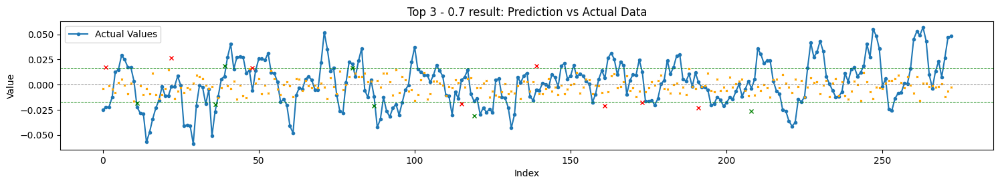

Total TH Pred.: 15
TH Pred. acc. : 46.67


Top 4 - 0.7
RMSE: 0.022764, STD_DEV: 0.022020, STD_PRD: 0.005383, OBJDIFF: 0.009063, RDIFF: 0.000744
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022999, inv. diff> 0.009298
Trend accuracy       : 54.779
Trend up accuracy    : 71.724
Trend down accuracy  : 35.433


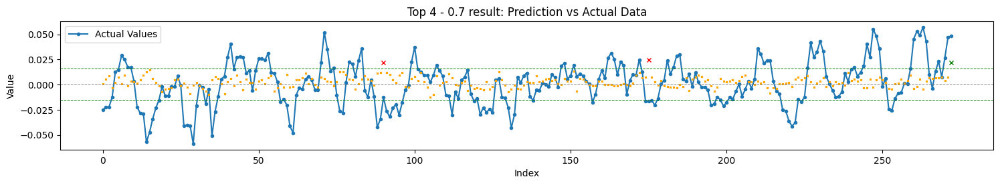

Total TH Pred.: 3
TH Pred. acc. : 33.33


Top 5 - 0.7
RMSE: 0.022941, STD_DEV: 0.022020, STD_PRD: 0.005698, OBJDIFF: 0.009082, RDIFF: 0.000921
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022817, inv. diff> 0.008959
Trend accuracy       : 50.000
Trend up accuracy    : 53.793
Trend down accuracy  : 45.669


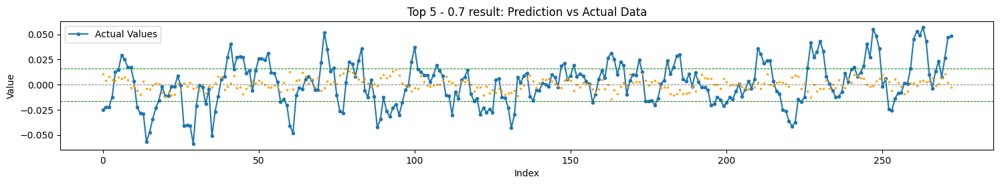

Total TH Pred.: 0


Top 6 - 0.7
RMSE: 0.022848, STD_DEV: 0.022020, STD_PRD: 0.005163, OBJDIFF: 0.009256, RDIFF: 0.000828
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022659, inv. diff> 0.009068
Trend accuracy       : 43.750
Trend up accuracy    : 10.345
Trend down accuracy  : 81.890


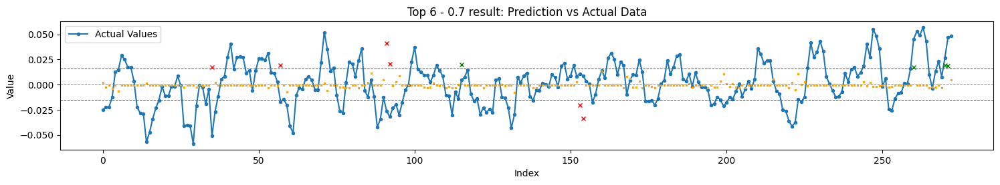

Total TH Pred.: 10
TH Pred. acc. : 40.00


Top 7 - 0.7
RMSE: 0.022997, STD_DEV: 0.022020, STD_PRD: 0.004565, OBJDIFF: 0.009705, RDIFF: 0.000977
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022538, inv. diff> 0.009246
Trend accuracy       : 49.632
Trend up accuracy    : 50.345
Trend down accuracy  : 48.819


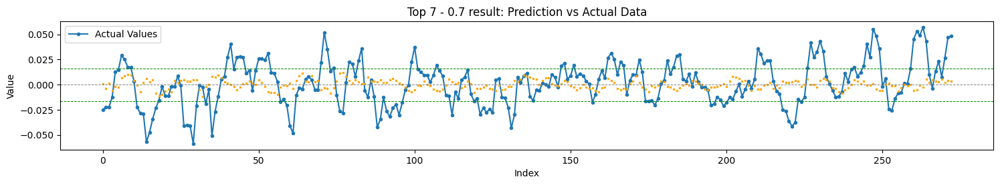

Total TH Pred.: 0


Top 8 - 0.7
RMSE: 0.022556, STD_DEV: 0.022020, STD_PRD: 0.003536, OBJDIFF: 0.009778, RDIFF: 0.000536
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022302, inv. diff> 0.009524
Trend accuracy       : 45.588
Trend up accuracy    : 34.483
Trend down accuracy  : 58.268


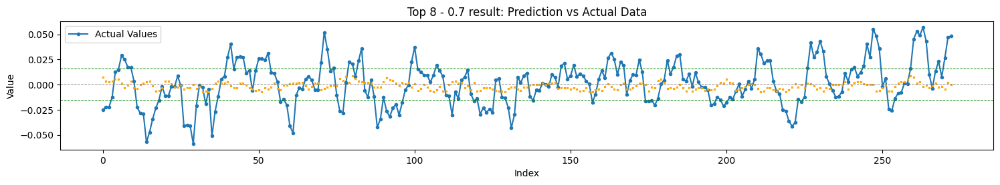

Total TH Pred.: 0


Top 9 - 0.7
RMSE: 0.022992, STD_DEV: 0.022020, STD_PRD: 0.004366, OBJDIFF: 0.009800, RDIFF: 0.000973
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022454, inv. diff> 0.009261
Trend accuracy       : 45.956
Trend up accuracy    : 31.724
Trend down accuracy  : 62.205


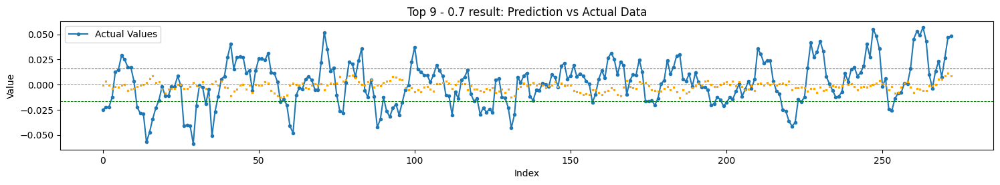

Total TH Pred.: 0


Top 10 - 0.7
RMSE: 0.024462, STD_DEV: 0.022020, STD_PRD: 0.007277, OBJDIFF: 0.009814, RDIFF: 0.002442
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023224, inv. diff> 0.008576
Trend accuracy       : 41.912
Trend up accuracy    : 39.310
Trend down accuracy  : 44.882


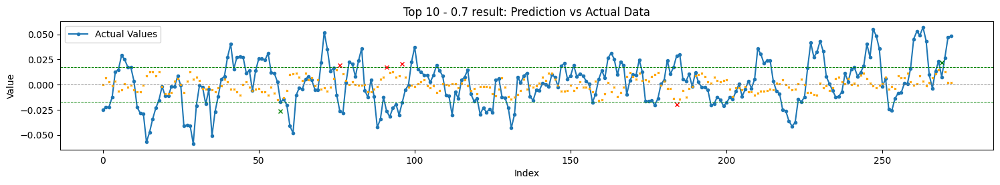

Total TH Pred.: 6
TH Pred. acc. : 33.33


Top 11 - 0.7
RMSE: 0.022981, STD_DEV: 0.022020, STD_PRD: 0.004304, OBJDIFF: 0.009819, RDIFF: 0.000961
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022466, inv. diff> 0.009304
Trend accuracy       : 45.588
Trend up accuracy    : 24.828
Trend down accuracy  : 69.291


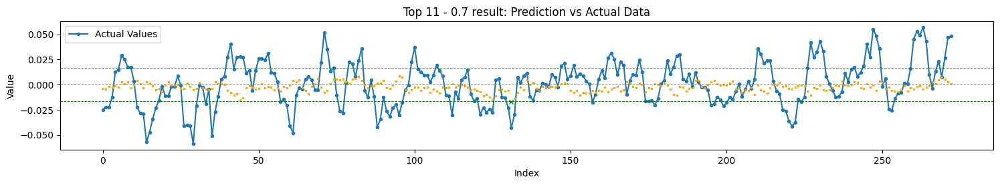

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 12 - 0.7
RMSE: 0.023610, STD_DEV: 0.022020, STD_PRD: 0.005396, OBJDIFF: 0.009903, RDIFF: 0.001591
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023033, inv. diff> 0.009325
Trend accuracy       : 47.794
Trend up accuracy    : 68.276
Trend down accuracy  : 24.409


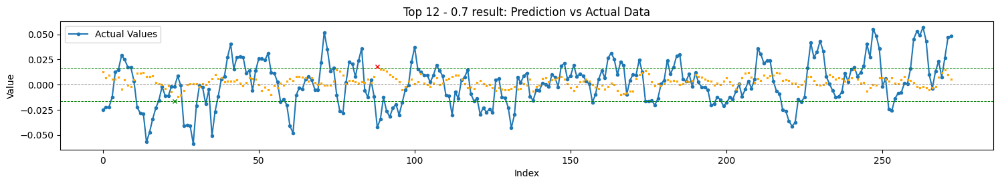

Total TH Pred.: 2
TH Pred. acc. : 50.00


Top 13 - 0.7
RMSE: 0.023374, STD_DEV: 0.022020, STD_PRD: 0.004506, OBJDIFF: 0.010111, RDIFF: 0.001354
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022502, inv. diff> 0.009239
Trend accuracy       : 44.485
Trend up accuracy    : 25.517
Trend down accuracy  : 66.142


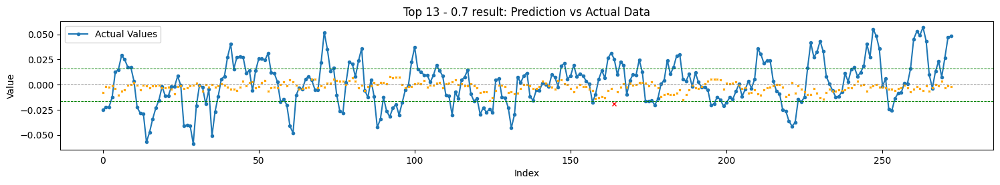

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 14 - 0.7
RMSE: 0.023967, STD_DEV: 0.022020, STD_PRD: 0.005485, OBJDIFF: 0.010215, RDIFF: 0.001948
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023128, inv. diff> 0.009376
Trend accuracy       : 47.794
Trend up accuracy    : 13.103
Trend down accuracy  : 87.402


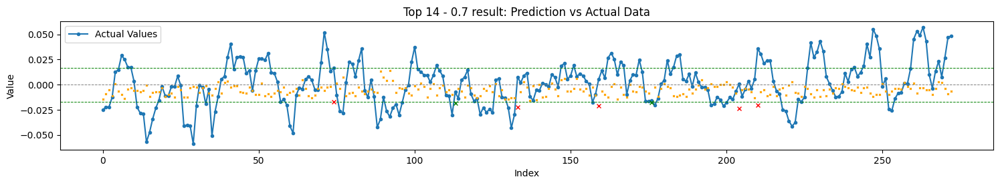

Total TH Pred.: 7
TH Pred. acc. : 28.57


Top 15 - 0.7
RMSE: 0.022910, STD_DEV: 0.022020, STD_PRD: 0.003322, OBJDIFF: 0.010239, RDIFF: 0.000890
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022271, inv. diff> 0.009600
Trend accuracy       : 44.853
Trend up accuracy    : 28.276
Trend down accuracy  : 63.780


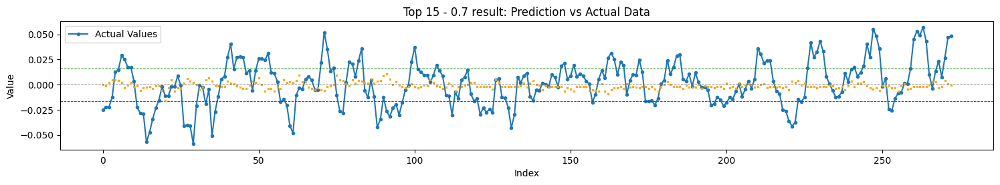

Total TH Pred.: 0


Top 16 - 0.7
RMSE: 0.023627, STD_DEV: 0.022020, STD_PRD: 0.004347, OBJDIFF: 0.010444, RDIFF: 0.001608
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022481, inv. diff> 0.009297
Trend accuracy       : 41.176
Trend up accuracy    : 21.379
Trend down accuracy  : 63.780


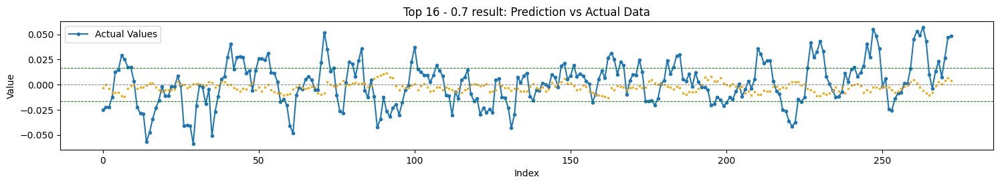

Total TH Pred.: 0


Top 17 - 0.7
RMSE: 0.022574, STD_DEV: 0.022020, STD_PRD: 0.002225, OBJDIFF: 0.010451, RDIFF: 0.000554
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022140, inv. diff> 0.010017
Trend accuracy       : 45.588
Trend up accuracy    : 13.793
Trend down accuracy  : 81.890


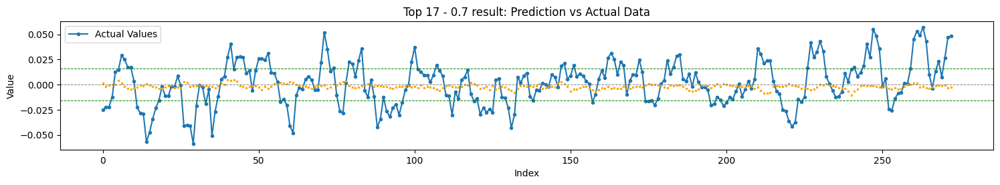

Total TH Pred.: 0


Top 18 - 0.7
RMSE: 0.022510, STD_DEV: 0.022020, STD_PRD: 0.001905, OBJDIFF: 0.010547, RDIFF: 0.000490
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022121, inv. diff> 0.010159
Trend accuracy       : 46.691
Trend up accuracy    : 7.586
Trend down accuracy  : 91.339


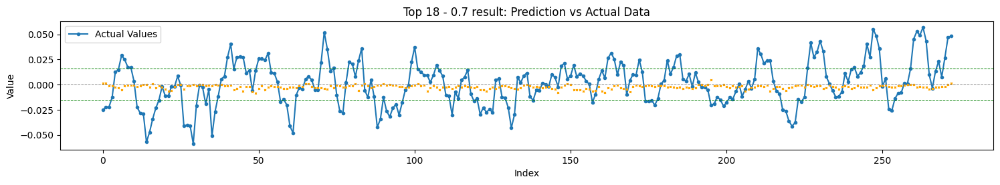

Total TH Pred.: 0


Top 19 - 0.7
RMSE: 0.023560, STD_DEV: 0.022020, STD_PRD: 0.003704, OBJDIFF: 0.010698, RDIFF: 0.001540
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022843, inv. diff> 0.009981
Trend accuracy       : 47.794
Trend up accuracy    : 5.517
Trend down accuracy  : 96.063


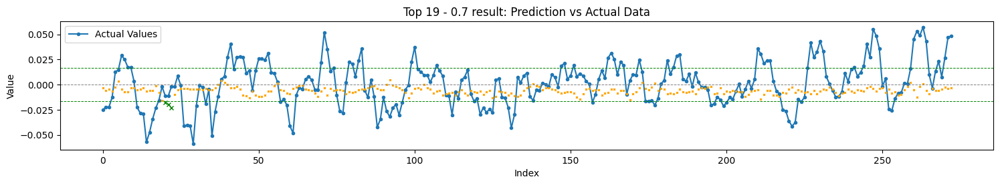

Total TH Pred.: 3
TH Pred. acc. : 100.00


Top 20 - 0.7
RMSE: 0.025242, STD_DEV: 0.022020, STD_PRD: 0.006816, OBJDIFF: 0.010825, RDIFF: 0.003223
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023693, inv. diff> 0.009275
Trend accuracy       : 44.118
Trend up accuracy    : 11.034
Trend down accuracy  : 81.890


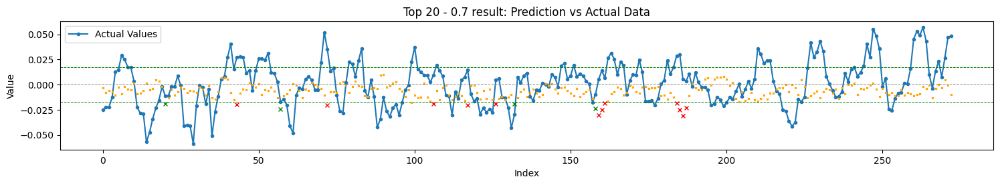

Total TH Pred.: 16
TH Pred. acc. : 25.00


Top 21 - 0.7
RMSE: 0.023026, STD_DEV: 0.022020, STD_PRD: 0.002252, OBJDIFF: 0.010890, RDIFF: 0.001006
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022331, inv. diff> 0.010195
Trend accuracy       : 44.853
Trend up accuracy    : 1.379
Trend down accuracy  : 94.488


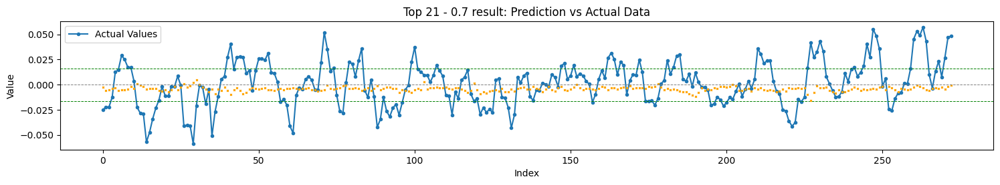

Total TH Pred.: 0


Top 22 - 0.7
RMSE: 0.023461, STD_DEV: 0.022020, STD_PRD: 0.002853, OBJDIFF: 0.011025, RDIFF: 0.001441
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022420, inv. diff> 0.009984
Trend accuracy       : 45.588
Trend up accuracy    : 1.379
Trend down accuracy  : 96.063


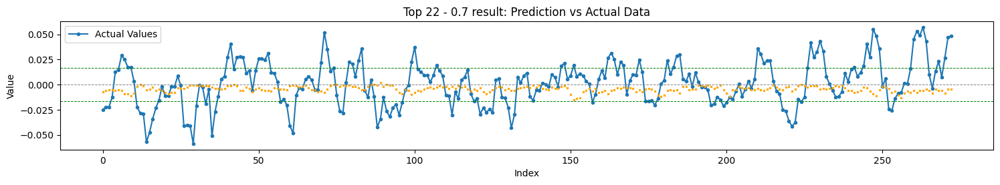

Total TH Pred.: 0


Top 23 - 0.7
RMSE: 0.023334, STD_DEV: 0.022020, STD_PRD: 0.002256, OBJDIFF: 0.011196, RDIFF: 0.001315
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022606, inv. diff> 0.010468
Trend accuracy       : 45.588
Trend up accuracy    : 0.000
Trend down accuracy  : 97.638


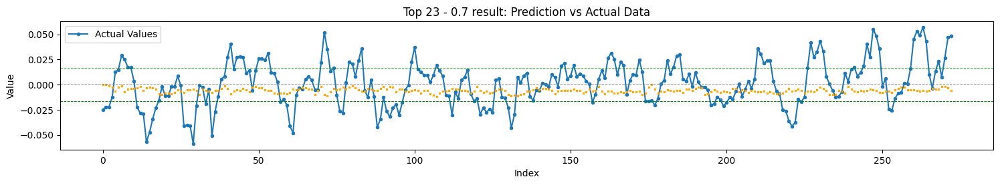

Total TH Pred.: 0


Top 24 - 0.7
RMSE: 0.026989, STD_DEV: 0.022020, STD_PRD: 0.009088, OBJDIFF: 0.011435, RDIFF: 0.004970
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.024486, inv. diff> 0.008932
Trend accuracy       : 42.279
Trend up accuracy    : 13.793
Trend down accuracy  : 74.803


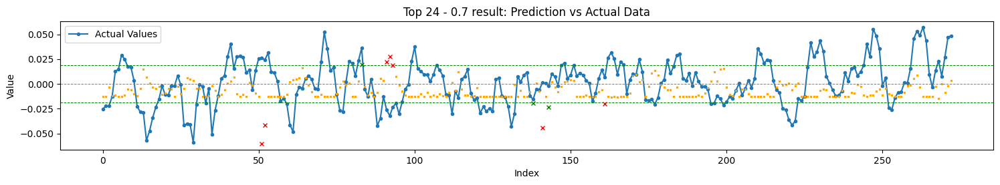

Total TH Pred.: 10
TH Pred. acc. : 30.00


Top 1 - 0.8
RMSE: 0.022016, STD_DEV: 0.022020, STD_PRD: 0.003622, OBJDIFF: 0.004596, RDIFF: -0.000003
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022319, inv. diff> 0.009498
Trend accuracy       : 55.147
Trend up accuracy    : 41.379
Trend down accuracy  : 70.866


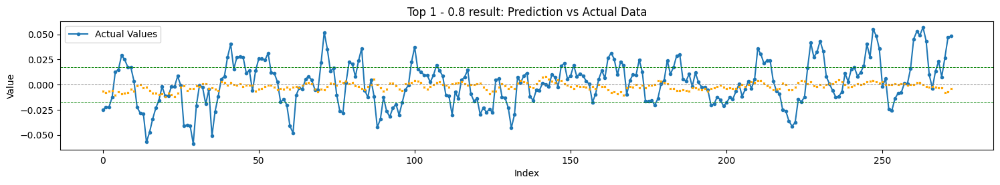

Total TH Pred.: 0


Top 2 - 0.8
RMSE: 0.022751, STD_DEV: 0.022020, STD_PRD: 0.006281, OBJDIFF: 0.008601, RDIFF: 0.000731
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022910, inv. diff> 0.008759
Trend accuracy       : 51.838
Trend up accuracy    : 42.759
Trend down accuracy  : 62.205


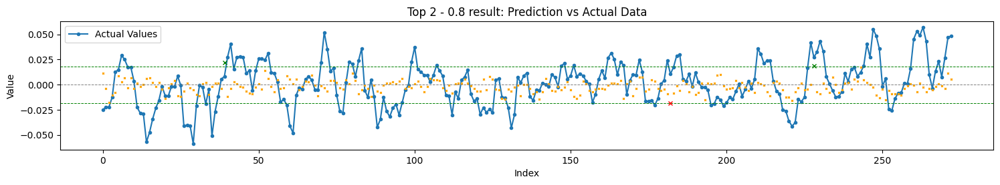

Total TH Pred.: 3
TH Pred. acc. : 66.67


Top 3 - 0.8
RMSE: 0.023870, STD_DEV: 0.022020, STD_PRD: 0.008442, OBJDIFF: 0.008639, RDIFF: 0.001850
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023587, inv. diff> 0.008356
Trend accuracy       : 47.426
Trend up accuracy    : 37.931
Trend down accuracy  : 58.268


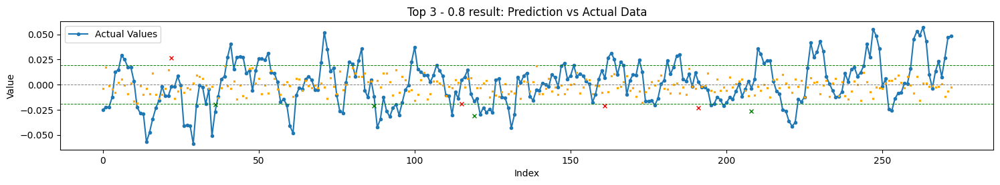

Total TH Pred.: 8
TH Pred. acc. : 50.00


Top 4 - 0.8
RMSE: 0.022764, STD_DEV: 0.022020, STD_PRD: 0.005383, OBJDIFF: 0.009063, RDIFF: 0.000744
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022999, inv. diff> 0.009298
Trend accuracy       : 54.779
Trend up accuracy    : 71.724
Trend down accuracy  : 35.433


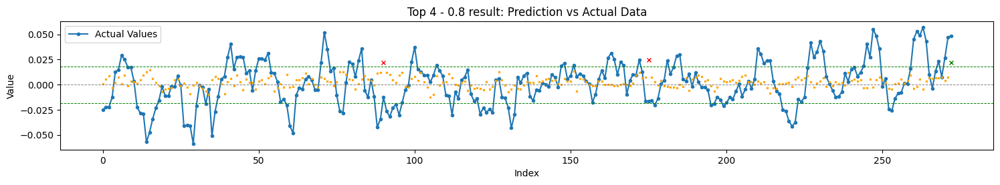

Total TH Pred.: 3
TH Pred. acc. : 33.33


Top 5 - 0.8
RMSE: 0.022941, STD_DEV: 0.022020, STD_PRD: 0.005698, OBJDIFF: 0.009082, RDIFF: 0.000921
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022817, inv. diff> 0.008959
Trend accuracy       : 50.000
Trend up accuracy    : 53.793
Trend down accuracy  : 45.669


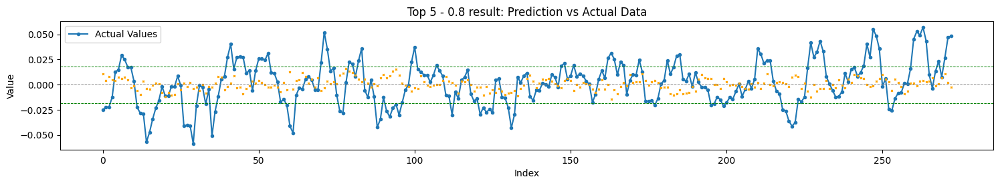

Total TH Pred.: 0


Top 6 - 0.8
RMSE: 0.022848, STD_DEV: 0.022020, STD_PRD: 0.005163, OBJDIFF: 0.009256, RDIFF: 0.000828
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022659, inv. diff> 0.009068
Trend accuracy       : 43.750
Trend up accuracy    : 10.345
Trend down accuracy  : 81.890


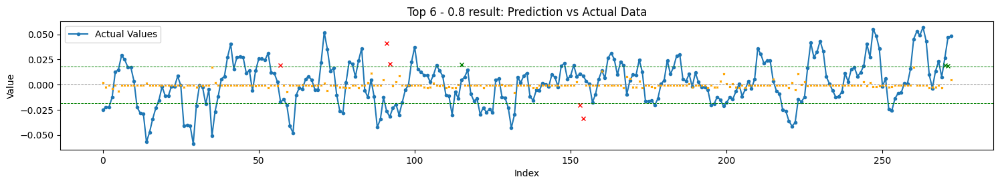

Total TH Pred.: 8
TH Pred. acc. : 37.50


Top 7 - 0.8
RMSE: 0.022997, STD_DEV: 0.022020, STD_PRD: 0.004565, OBJDIFF: 0.009705, RDIFF: 0.000977
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022538, inv. diff> 0.009246
Trend accuracy       : 49.632
Trend up accuracy    : 50.345
Trend down accuracy  : 48.819


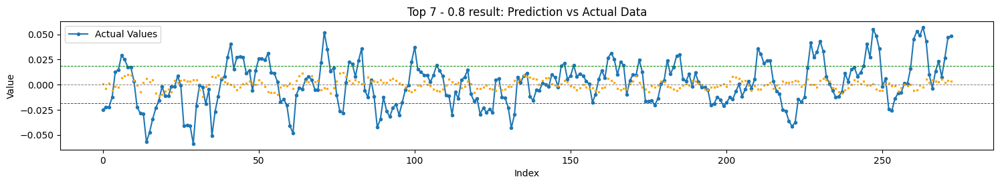

Total TH Pred.: 0


Top 8 - 0.8
RMSE: 0.022556, STD_DEV: 0.022020, STD_PRD: 0.003536, OBJDIFF: 0.009778, RDIFF: 0.000536
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022302, inv. diff> 0.009524
Trend accuracy       : 45.588
Trend up accuracy    : 34.483
Trend down accuracy  : 58.268


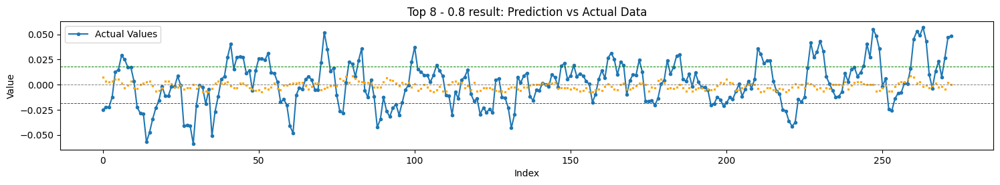

Total TH Pred.: 0


Top 9 - 0.8
RMSE: 0.022992, STD_DEV: 0.022020, STD_PRD: 0.004366, OBJDIFF: 0.009800, RDIFF: 0.000973
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022454, inv. diff> 0.009261
Trend accuracy       : 45.956
Trend up accuracy    : 31.724
Trend down accuracy  : 62.205


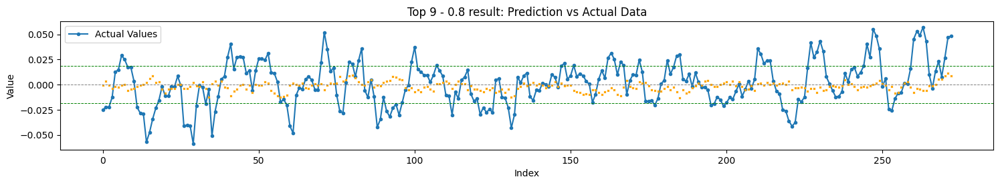

Total TH Pred.: 0


Top 10 - 0.8
RMSE: 0.024462, STD_DEV: 0.022020, STD_PRD: 0.007277, OBJDIFF: 0.009814, RDIFF: 0.002442
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023224, inv. diff> 0.008576
Trend accuracy       : 41.912
Trend up accuracy    : 39.310
Trend down accuracy  : 44.882


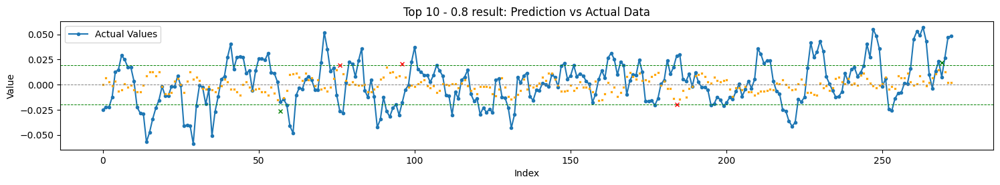

Total TH Pred.: 5
TH Pred. acc. : 40.00


Top 11 - 0.8
RMSE: 0.022981, STD_DEV: 0.022020, STD_PRD: 0.004304, OBJDIFF: 0.009819, RDIFF: 0.000961
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022466, inv. diff> 0.009304
Trend accuracy       : 45.588
Trend up accuracy    : 24.828
Trend down accuracy  : 69.291


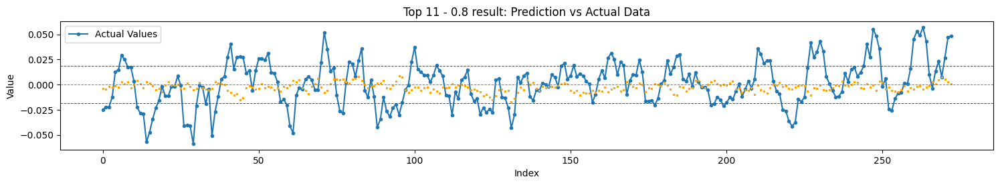

Total TH Pred.: 0


Top 12 - 0.8
RMSE: 0.023610, STD_DEV: 0.022020, STD_PRD: 0.005396, OBJDIFF: 0.009903, RDIFF: 0.001591
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023033, inv. diff> 0.009325
Trend accuracy       : 47.794
Trend up accuracy    : 68.276
Trend down accuracy  : 24.409


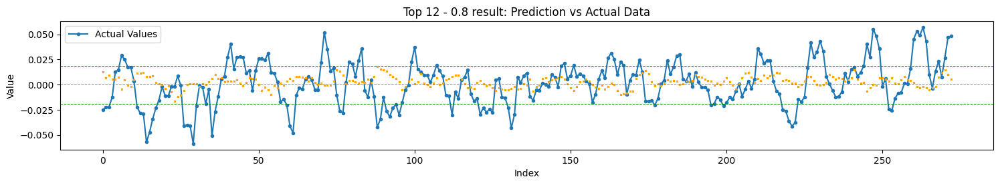

Total TH Pred.: 0


Top 13 - 0.8
RMSE: 0.023374, STD_DEV: 0.022020, STD_PRD: 0.004506, OBJDIFF: 0.010111, RDIFF: 0.001354
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022502, inv. diff> 0.009239
Trend accuracy       : 44.485
Trend up accuracy    : 25.517
Trend down accuracy  : 66.142


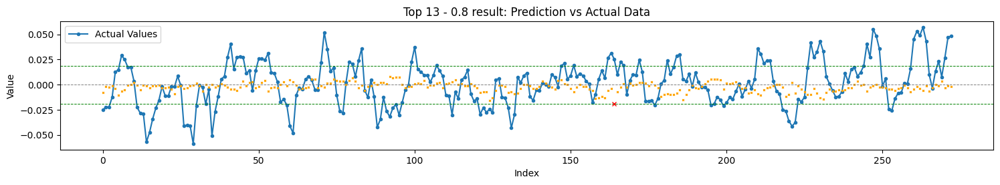

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 14 - 0.8
RMSE: 0.023967, STD_DEV: 0.022020, STD_PRD: 0.005485, OBJDIFF: 0.010215, RDIFF: 0.001948
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023128, inv. diff> 0.009376
Trend accuracy       : 47.794
Trend up accuracy    : 13.103
Trend down accuracy  : 87.402


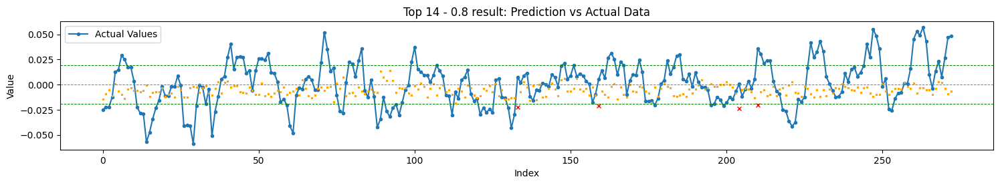

Total TH Pred.: 4
TH Pred. acc. : 0.00


Top 15 - 0.8
RMSE: 0.022910, STD_DEV: 0.022020, STD_PRD: 0.003322, OBJDIFF: 0.010239, RDIFF: 0.000890
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022271, inv. diff> 0.009600
Trend accuracy       : 44.853
Trend up accuracy    : 28.276
Trend down accuracy  : 63.780


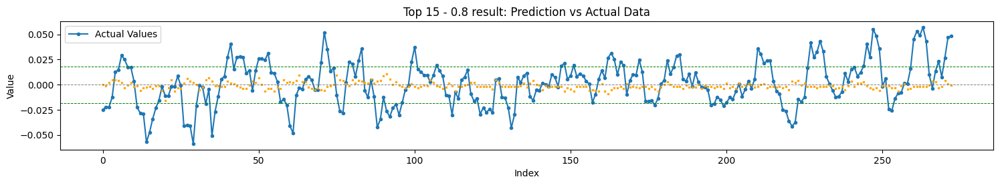

Total TH Pred.: 0


Top 16 - 0.8
RMSE: 0.023627, STD_DEV: 0.022020, STD_PRD: 0.004347, OBJDIFF: 0.010444, RDIFF: 0.001608
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022481, inv. diff> 0.009297
Trend accuracy       : 41.176
Trend up accuracy    : 21.379
Trend down accuracy  : 63.780


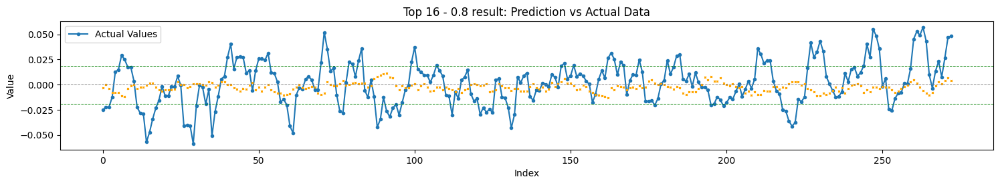

Total TH Pred.: 0


Top 17 - 0.8
RMSE: 0.022574, STD_DEV: 0.022020, STD_PRD: 0.002225, OBJDIFF: 0.010451, RDIFF: 0.000554
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022140, inv. diff> 0.010017
Trend accuracy       : 45.588
Trend up accuracy    : 13.793
Trend down accuracy  : 81.890


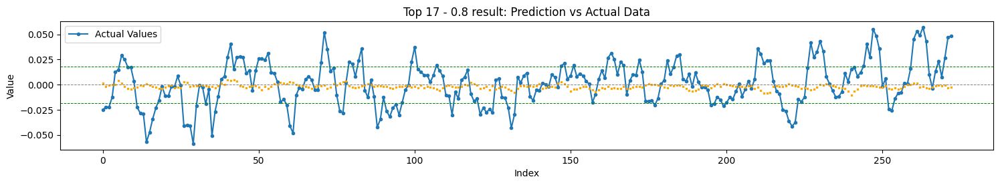

Total TH Pred.: 0


Top 18 - 0.8
RMSE: 0.022510, STD_DEV: 0.022020, STD_PRD: 0.001905, OBJDIFF: 0.010547, RDIFF: 0.000490
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022121, inv. diff> 0.010159
Trend accuracy       : 46.691
Trend up accuracy    : 7.586
Trend down accuracy  : 91.339


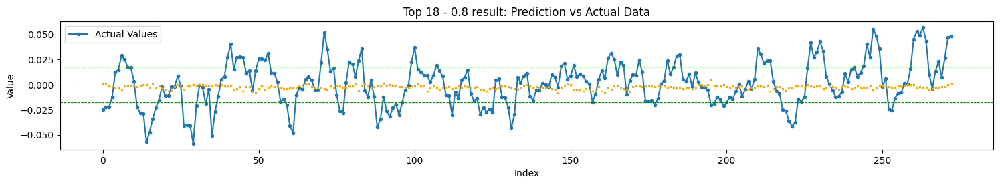

Total TH Pred.: 0


Top 19 - 0.8
RMSE: 0.023560, STD_DEV: 0.022020, STD_PRD: 0.003704, OBJDIFF: 0.010698, RDIFF: 0.001540
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022843, inv. diff> 0.009981
Trend accuracy       : 47.794
Trend up accuracy    : 5.517
Trend down accuracy  : 96.063


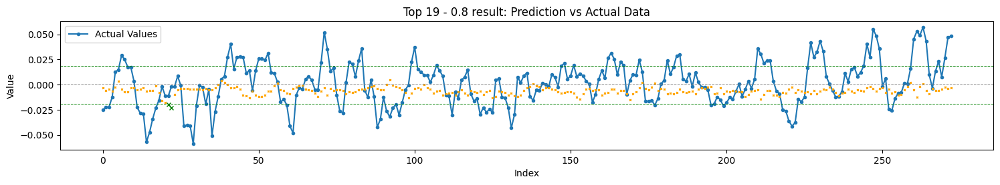

Total TH Pred.: 2
TH Pred. acc. : 100.00


Top 20 - 0.8
RMSE: 0.025242, STD_DEV: 0.022020, STD_PRD: 0.006816, OBJDIFF: 0.010825, RDIFF: 0.003223
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023693, inv. diff> 0.009275
Trend accuracy       : 44.118
Trend up accuracy    : 11.034
Trend down accuracy  : 81.890


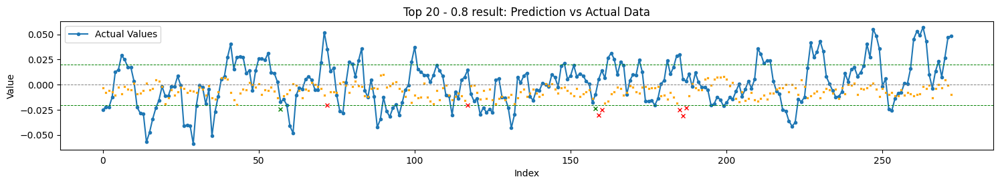

Total TH Pred.: 9
TH Pred. acc. : 22.22


Top 21 - 0.8
RMSE: 0.023026, STD_DEV: 0.022020, STD_PRD: 0.002252, OBJDIFF: 0.010890, RDIFF: 0.001006
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022331, inv. diff> 0.010195
Trend accuracy       : 44.853
Trend up accuracy    : 1.379
Trend down accuracy  : 94.488


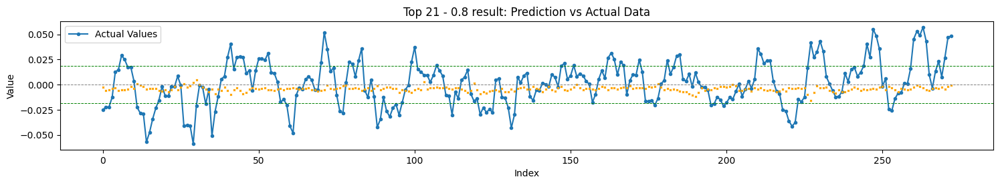

Total TH Pred.: 0


Top 22 - 0.8
RMSE: 0.023461, STD_DEV: 0.022020, STD_PRD: 0.002853, OBJDIFF: 0.011025, RDIFF: 0.001441
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022420, inv. diff> 0.009984
Trend accuracy       : 45.588
Trend up accuracy    : 1.379
Trend down accuracy  : 96.063


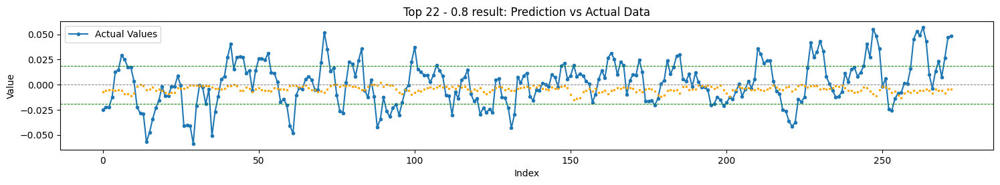

Total TH Pred.: 0


Top 23 - 0.8
RMSE: 0.023334, STD_DEV: 0.022020, STD_PRD: 0.002256, OBJDIFF: 0.011196, RDIFF: 0.001315
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022606, inv. diff> 0.010468
Trend accuracy       : 45.588
Trend up accuracy    : 0.000
Trend down accuracy  : 97.638


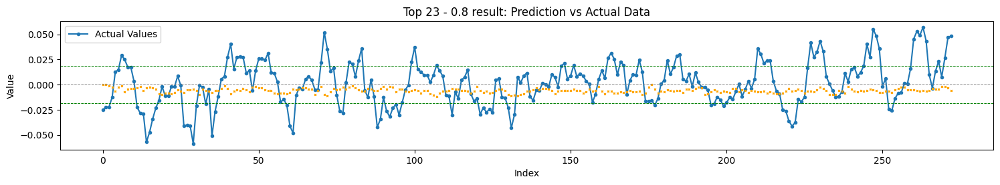

Total TH Pred.: 0


Top 24 - 0.8
RMSE: 0.026989, STD_DEV: 0.022020, STD_PRD: 0.009088, OBJDIFF: 0.011435, RDIFF: 0.004970
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.024486, inv. diff> 0.008932
Trend accuracy       : 42.279
Trend up accuracy    : 13.793
Trend down accuracy  : 74.803


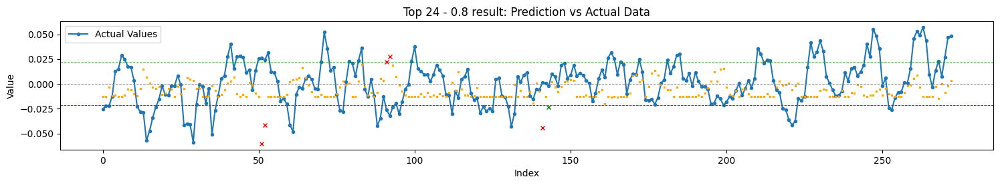

Total TH Pred.: 6
TH Pred. acc. : 16.67


Top 1 - 0.9
RMSE: 0.022016, STD_DEV: 0.022020, STD_PRD: 0.003622, OBJDIFF: 0.004596, RDIFF: -0.000003
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022319, inv. diff> 0.009498
Trend accuracy       : 55.147
Trend up accuracy    : 41.379
Trend down accuracy  : 70.866


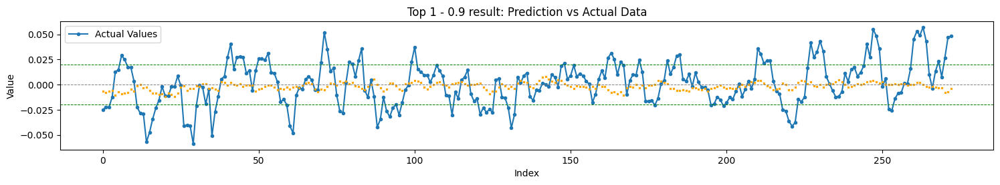

Total TH Pred.: 0


Top 2 - 0.9
RMSE: 0.022751, STD_DEV: 0.022020, STD_PRD: 0.006281, OBJDIFF: 0.008601, RDIFF: 0.000731
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022910, inv. diff> 0.008759
Trend accuracy       : 51.838
Trend up accuracy    : 42.759
Trend down accuracy  : 62.205


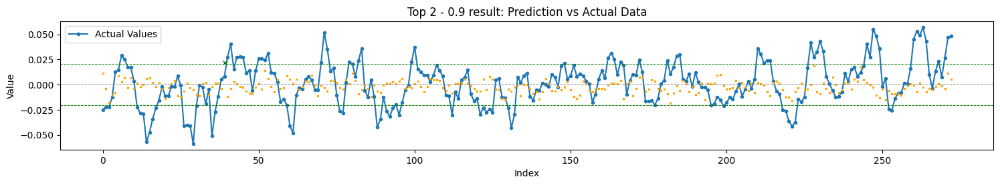

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 3 - 0.9
RMSE: 0.023870, STD_DEV: 0.022020, STD_PRD: 0.008442, OBJDIFF: 0.008639, RDIFF: 0.001850
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023587, inv. diff> 0.008356
Trend accuracy       : 47.426
Trend up accuracy    : 37.931
Trend down accuracy  : 58.268


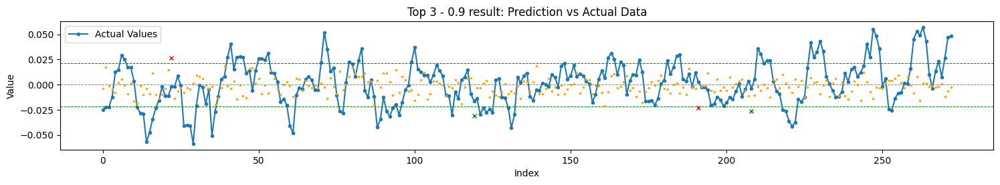

Total TH Pred.: 4
TH Pred. acc. : 50.00


Top 4 - 0.9
RMSE: 0.022764, STD_DEV: 0.022020, STD_PRD: 0.005383, OBJDIFF: 0.009063, RDIFF: 0.000744
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022999, inv. diff> 0.009298
Trend accuracy       : 54.779
Trend up accuracy    : 71.724
Trend down accuracy  : 35.433


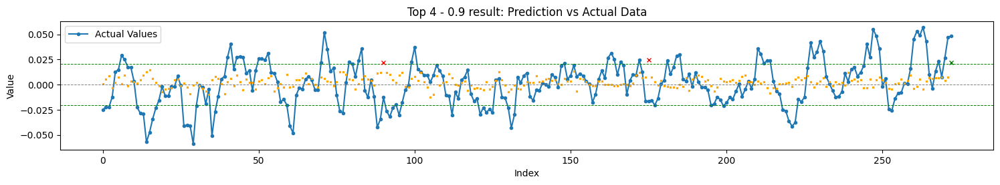

Total TH Pred.: 3
TH Pred. acc. : 33.33


Top 5 - 0.9
RMSE: 0.022941, STD_DEV: 0.022020, STD_PRD: 0.005698, OBJDIFF: 0.009082, RDIFF: 0.000921
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022817, inv. diff> 0.008959
Trend accuracy       : 50.000
Trend up accuracy    : 53.793
Trend down accuracy  : 45.669


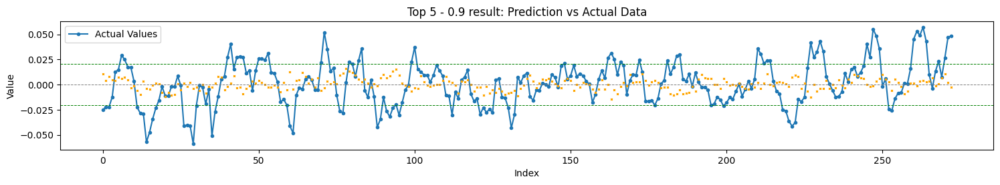

Total TH Pred.: 0


Top 6 - 0.9
RMSE: 0.022848, STD_DEV: 0.022020, STD_PRD: 0.005163, OBJDIFF: 0.009256, RDIFF: 0.000828
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022659, inv. diff> 0.009068
Trend accuracy       : 43.750
Trend up accuracy    : 10.345
Trend down accuracy  : 81.890


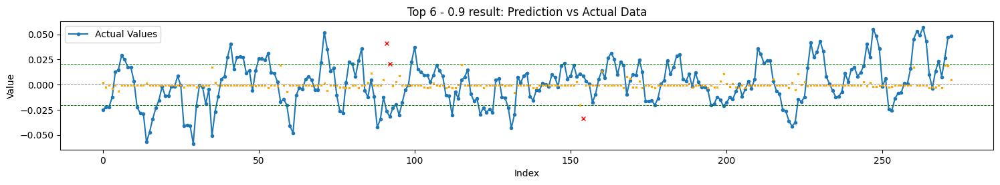

Total TH Pred.: 3
TH Pred. acc. : 0.00


Top 7 - 0.9
RMSE: 0.022997, STD_DEV: 0.022020, STD_PRD: 0.004565, OBJDIFF: 0.009705, RDIFF: 0.000977
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022538, inv. diff> 0.009246
Trend accuracy       : 49.632
Trend up accuracy    : 50.345
Trend down accuracy  : 48.819


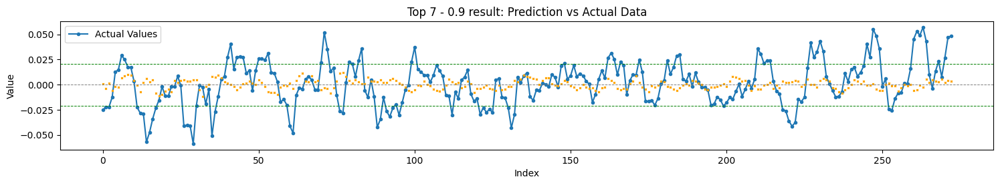

Total TH Pred.: 0


Top 8 - 0.9
RMSE: 0.022556, STD_DEV: 0.022020, STD_PRD: 0.003536, OBJDIFF: 0.009778, RDIFF: 0.000536
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022302, inv. diff> 0.009524
Trend accuracy       : 45.588
Trend up accuracy    : 34.483
Trend down accuracy  : 58.268


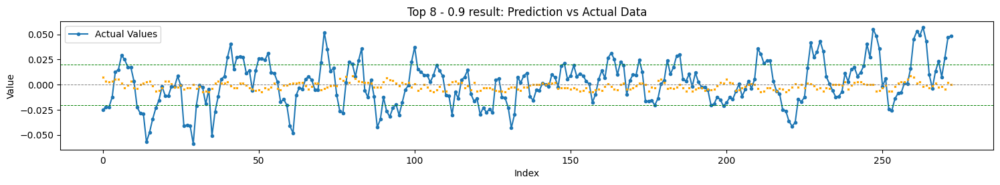

Total TH Pred.: 0


Top 9 - 0.9
RMSE: 0.022992, STD_DEV: 0.022020, STD_PRD: 0.004366, OBJDIFF: 0.009800, RDIFF: 0.000973
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022454, inv. diff> 0.009261
Trend accuracy       : 45.956
Trend up accuracy    : 31.724
Trend down accuracy  : 62.205


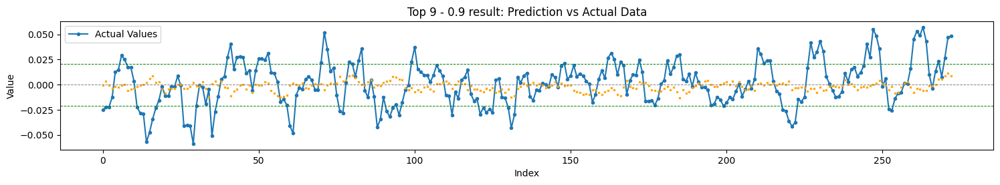

Total TH Pred.: 0


Top 10 - 0.9
RMSE: 0.024462, STD_DEV: 0.022020, STD_PRD: 0.007277, OBJDIFF: 0.009814, RDIFF: 0.002442
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023224, inv. diff> 0.008576
Trend accuracy       : 41.912
Trend up accuracy    : 39.310
Trend down accuracy  : 44.882


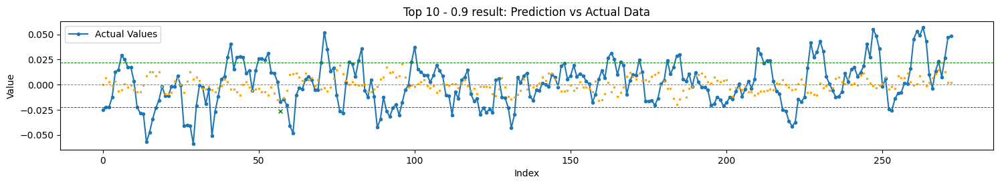

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 11 - 0.9
RMSE: 0.022981, STD_DEV: 0.022020, STD_PRD: 0.004304, OBJDIFF: 0.009819, RDIFF: 0.000961
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022466, inv. diff> 0.009304
Trend accuracy       : 45.588
Trend up accuracy    : 24.828
Trend down accuracy  : 69.291


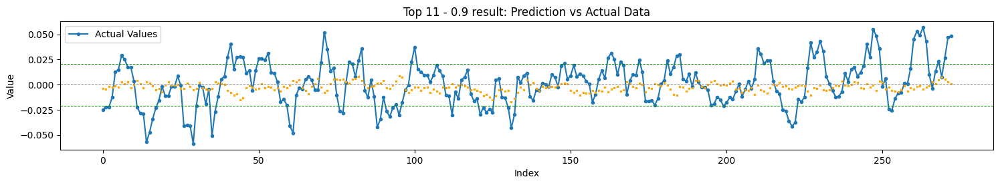

Total TH Pred.: 0


Top 12 - 0.9
RMSE: 0.023610, STD_DEV: 0.022020, STD_PRD: 0.005396, OBJDIFF: 0.009903, RDIFF: 0.001591
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023033, inv. diff> 0.009325
Trend accuracy       : 47.794
Trend up accuracy    : 68.276
Trend down accuracy  : 24.409


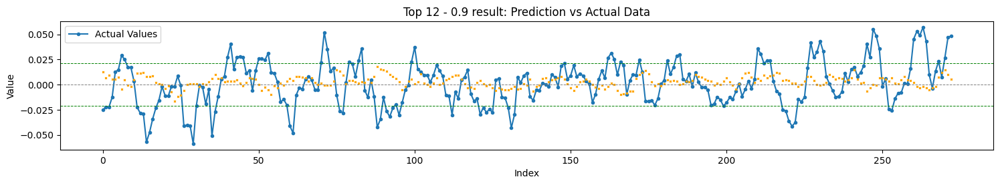

Total TH Pred.: 0


Top 13 - 0.9
RMSE: 0.023374, STD_DEV: 0.022020, STD_PRD: 0.004506, OBJDIFF: 0.010111, RDIFF: 0.001354
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022502, inv. diff> 0.009239
Trend accuracy       : 44.485
Trend up accuracy    : 25.517
Trend down accuracy  : 66.142


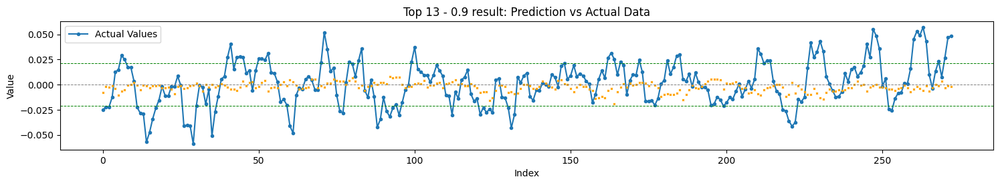

Total TH Pred.: 0


Top 14 - 0.9
RMSE: 0.023967, STD_DEV: 0.022020, STD_PRD: 0.005485, OBJDIFF: 0.010215, RDIFF: 0.001948
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023128, inv. diff> 0.009376
Trend accuracy       : 47.794
Trend up accuracy    : 13.103
Trend down accuracy  : 87.402


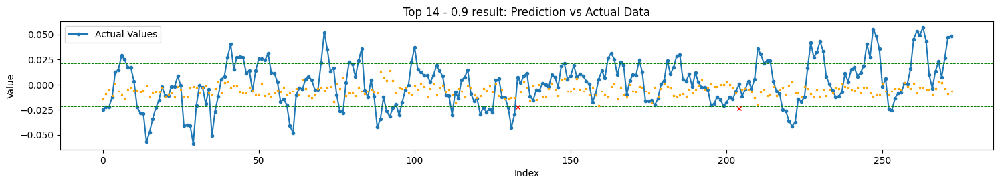

Total TH Pred.: 2
TH Pred. acc. : 0.00


Top 15 - 0.9
RMSE: 0.022910, STD_DEV: 0.022020, STD_PRD: 0.003322, OBJDIFF: 0.010239, RDIFF: 0.000890
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022271, inv. diff> 0.009600
Trend accuracy       : 44.853
Trend up accuracy    : 28.276
Trend down accuracy  : 63.780


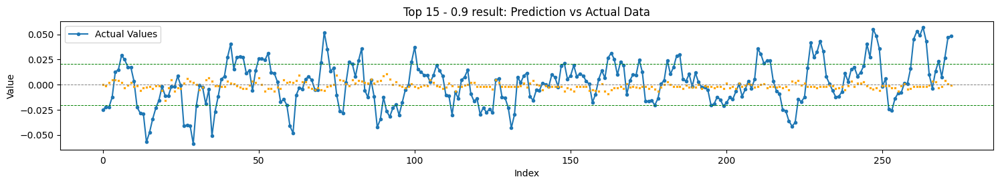

Total TH Pred.: 0


Top 16 - 0.9
RMSE: 0.023627, STD_DEV: 0.022020, STD_PRD: 0.004347, OBJDIFF: 0.010444, RDIFF: 0.001608
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022481, inv. diff> 0.009297
Trend accuracy       : 41.176
Trend up accuracy    : 21.379
Trend down accuracy  : 63.780


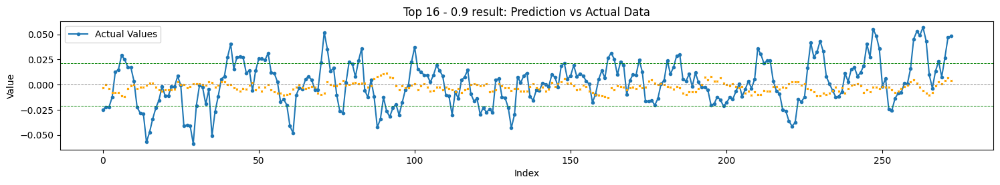

Total TH Pred.: 0


Top 17 - 0.9
RMSE: 0.022574, STD_DEV: 0.022020, STD_PRD: 0.002225, OBJDIFF: 0.010451, RDIFF: 0.000554
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022140, inv. diff> 0.010017
Trend accuracy       : 45.588
Trend up accuracy    : 13.793
Trend down accuracy  : 81.890


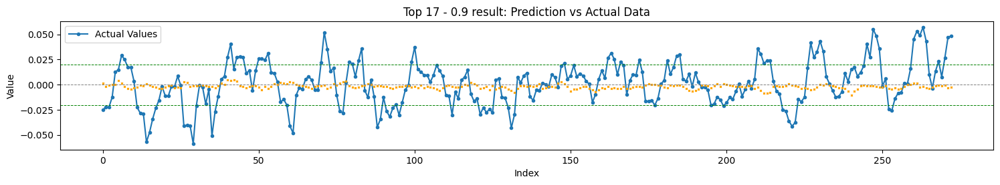

Total TH Pred.: 0


Top 18 - 0.9
RMSE: 0.022510, STD_DEV: 0.022020, STD_PRD: 0.001905, OBJDIFF: 0.010547, RDIFF: 0.000490
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022121, inv. diff> 0.010159
Trend accuracy       : 46.691
Trend up accuracy    : 7.586
Trend down accuracy  : 91.339


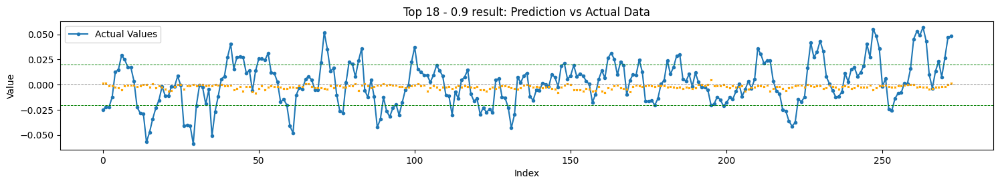

Total TH Pred.: 0


Top 19 - 0.9
RMSE: 0.023560, STD_DEV: 0.022020, STD_PRD: 0.003704, OBJDIFF: 0.010698, RDIFF: 0.001540
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022843, inv. diff> 0.009981
Trend accuracy       : 47.794
Trend up accuracy    : 5.517
Trend down accuracy  : 96.063


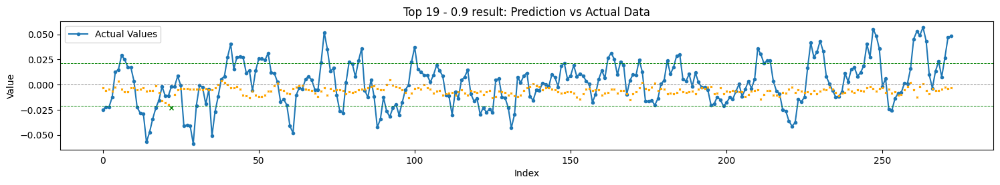

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 20 - 0.9
RMSE: 0.025242, STD_DEV: 0.022020, STD_PRD: 0.006816, OBJDIFF: 0.010825, RDIFF: 0.003223
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023693, inv. diff> 0.009275
Trend accuracy       : 44.118
Trend up accuracy    : 11.034
Trend down accuracy  : 81.890


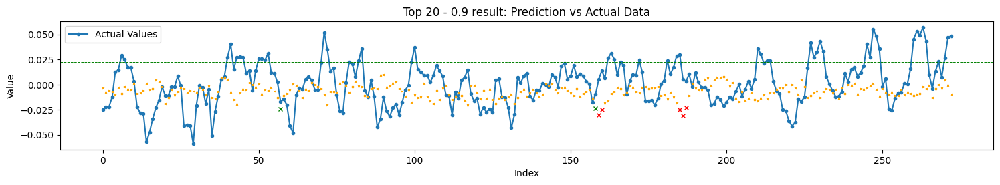

Total TH Pred.: 7
TH Pred. acc. : 28.57


Top 21 - 0.9
RMSE: 0.023026, STD_DEV: 0.022020, STD_PRD: 0.002252, OBJDIFF: 0.010890, RDIFF: 0.001006
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022331, inv. diff> 0.010195
Trend accuracy       : 44.853
Trend up accuracy    : 1.379
Trend down accuracy  : 94.488


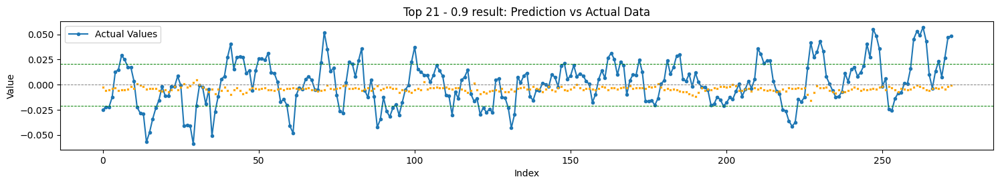

Total TH Pred.: 0


Top 22 - 0.9
RMSE: 0.023461, STD_DEV: 0.022020, STD_PRD: 0.002853, OBJDIFF: 0.011025, RDIFF: 0.001441
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022420, inv. diff> 0.009984
Trend accuracy       : 45.588
Trend up accuracy    : 1.379
Trend down accuracy  : 96.063


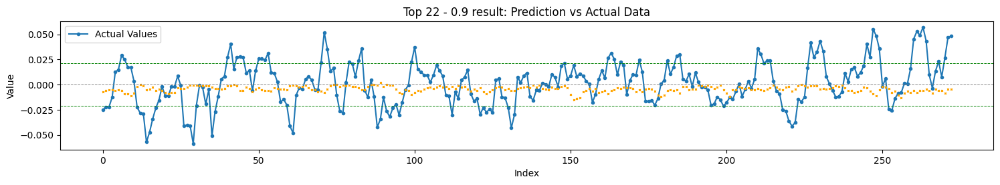

Total TH Pred.: 0


Top 23 - 0.9
RMSE: 0.023334, STD_DEV: 0.022020, STD_PRD: 0.002256, OBJDIFF: 0.011196, RDIFF: 0.001315
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022606, inv. diff> 0.010468
Trend accuracy       : 45.588
Trend up accuracy    : 0.000
Trend down accuracy  : 97.638


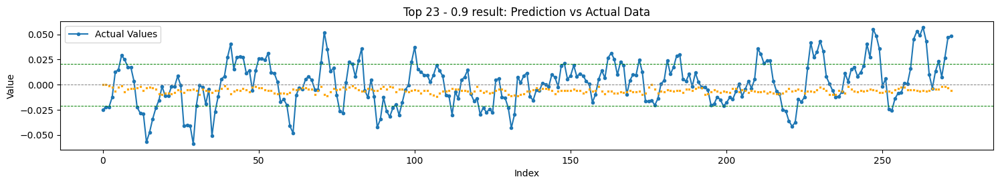

Total TH Pred.: 0


Top 24 - 0.9
RMSE: 0.026989, STD_DEV: 0.022020, STD_PRD: 0.009088, OBJDIFF: 0.011435, RDIFF: 0.004970
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.024486, inv. diff> 0.008932
Trend accuracy       : 42.279
Trend up accuracy    : 13.793
Trend down accuracy  : 74.803


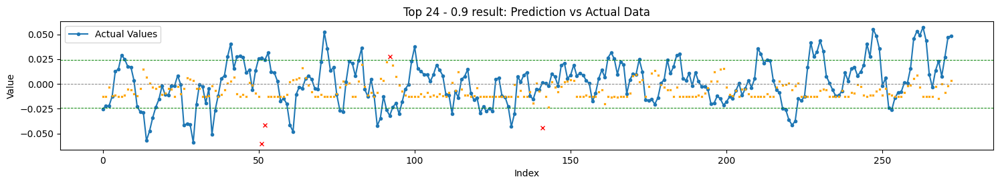

Total TH Pred.: 4
TH Pred. acc. : 0.00


Top 1 - 1.0
RMSE: 0.022016, STD_DEV: 0.022020, STD_PRD: 0.003622, OBJDIFF: 0.004596, RDIFF: -0.000003
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022319, inv. diff> 0.009498
Trend accuracy       : 55.147
Trend up accuracy    : 41.379
Trend down accuracy  : 70.866


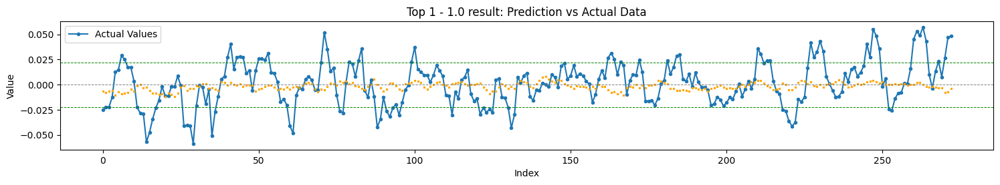

Total TH Pred.: 0


Top 2 - 1.0
RMSE: 0.022751, STD_DEV: 0.022020, STD_PRD: 0.006281, OBJDIFF: 0.008601, RDIFF: 0.000731
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022910, inv. diff> 0.008759
Trend accuracy       : 51.838
Trend up accuracy    : 42.759
Trend down accuracy  : 62.205


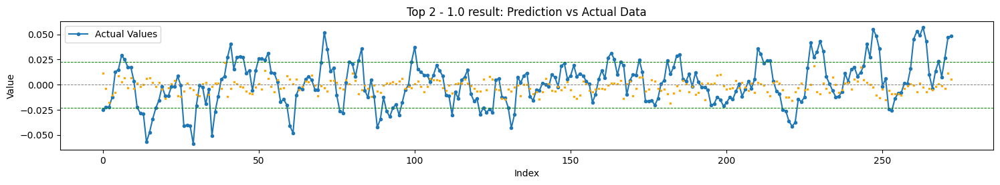

Total TH Pred.: 0


Top 3 - 1.0
RMSE: 0.023870, STD_DEV: 0.022020, STD_PRD: 0.008442, OBJDIFF: 0.008639, RDIFF: 0.001850
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023587, inv. diff> 0.008356
Trend accuracy       : 47.426
Trend up accuracy    : 37.931
Trend down accuracy  : 58.268


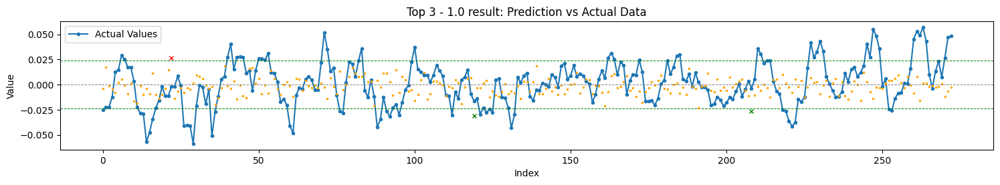

Total TH Pred.: 3
TH Pred. acc. : 66.67


Top 4 - 1.0
RMSE: 0.022764, STD_DEV: 0.022020, STD_PRD: 0.005383, OBJDIFF: 0.009063, RDIFF: 0.000744
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022999, inv. diff> 0.009298
Trend accuracy       : 54.779
Trend up accuracy    : 71.724
Trend down accuracy  : 35.433


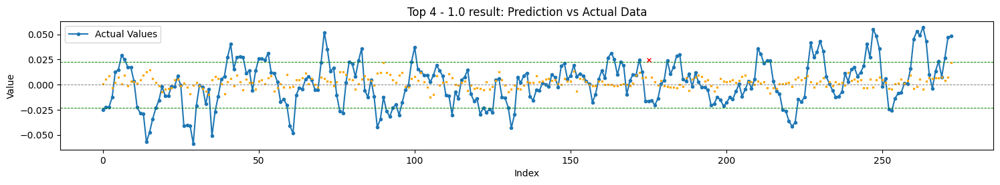

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 5 - 1.0
RMSE: 0.022941, STD_DEV: 0.022020, STD_PRD: 0.005698, OBJDIFF: 0.009082, RDIFF: 0.000921
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022817, inv. diff> 0.008959
Trend accuracy       : 50.000
Trend up accuracy    : 53.793
Trend down accuracy  : 45.669


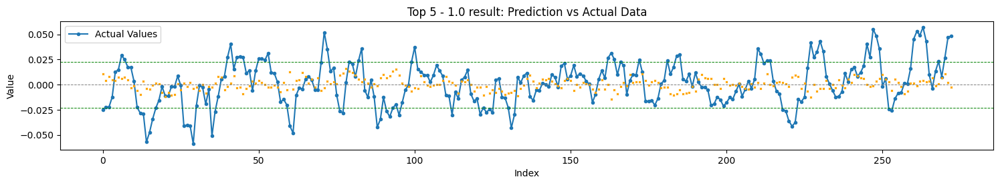

Total TH Pred.: 0


Top 6 - 1.0
RMSE: 0.022848, STD_DEV: 0.022020, STD_PRD: 0.005163, OBJDIFF: 0.009256, RDIFF: 0.000828
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022659, inv. diff> 0.009068
Trend accuracy       : 43.750
Trend up accuracy    : 10.345
Trend down accuracy  : 81.890


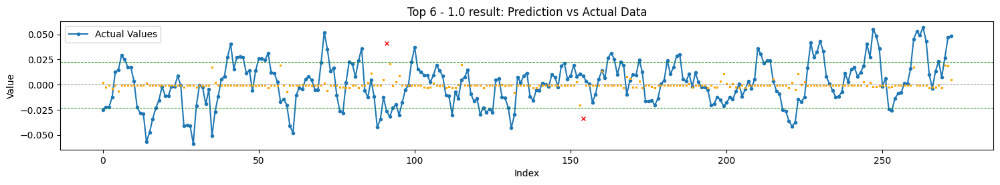

Total TH Pred.: 2
TH Pred. acc. : 0.00


Top 7 - 1.0
RMSE: 0.022997, STD_DEV: 0.022020, STD_PRD: 0.004565, OBJDIFF: 0.009705, RDIFF: 0.000977
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022538, inv. diff> 0.009246
Trend accuracy       : 49.632
Trend up accuracy    : 50.345
Trend down accuracy  : 48.819


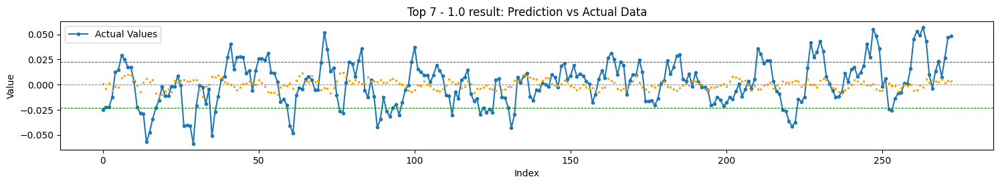

Total TH Pred.: 0


Top 8 - 1.0
RMSE: 0.022556, STD_DEV: 0.022020, STD_PRD: 0.003536, OBJDIFF: 0.009778, RDIFF: 0.000536
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022302, inv. diff> 0.009524
Trend accuracy       : 45.588
Trend up accuracy    : 34.483
Trend down accuracy  : 58.268


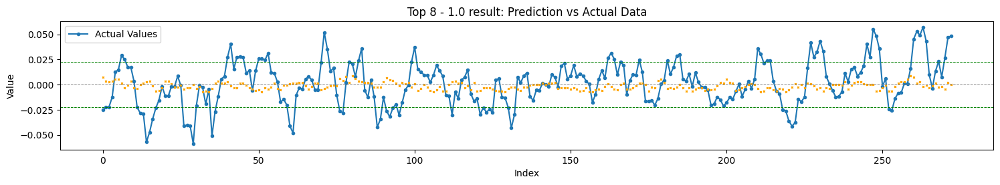

Total TH Pred.: 0


Top 9 - 1.0
RMSE: 0.022992, STD_DEV: 0.022020, STD_PRD: 0.004366, OBJDIFF: 0.009800, RDIFF: 0.000973
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022454, inv. diff> 0.009261
Trend accuracy       : 45.956
Trend up accuracy    : 31.724
Trend down accuracy  : 62.205


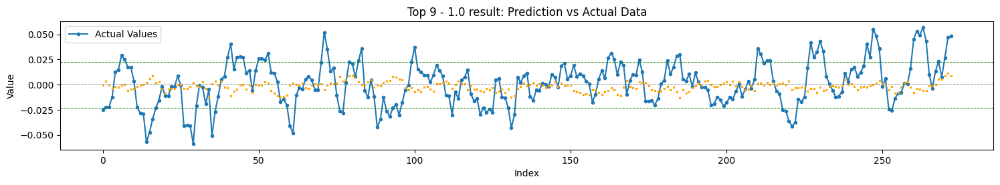

Total TH Pred.: 0


Top 10 - 1.0
RMSE: 0.024462, STD_DEV: 0.022020, STD_PRD: 0.007277, OBJDIFF: 0.009814, RDIFF: 0.002442
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023224, inv. diff> 0.008576
Trend accuracy       : 41.912
Trend up accuracy    : 39.310
Trend down accuracy  : 44.882


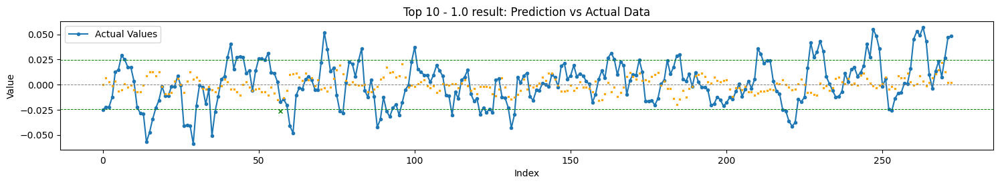

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 11 - 1.0
RMSE: 0.022981, STD_DEV: 0.022020, STD_PRD: 0.004304, OBJDIFF: 0.009819, RDIFF: 0.000961
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022466, inv. diff> 0.009304
Trend accuracy       : 45.588
Trend up accuracy    : 24.828
Trend down accuracy  : 69.291


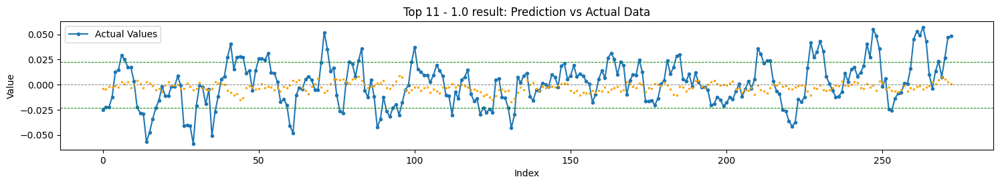

Total TH Pred.: 0


Top 12 - 1.0
RMSE: 0.023610, STD_DEV: 0.022020, STD_PRD: 0.005396, OBJDIFF: 0.009903, RDIFF: 0.001591
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023033, inv. diff> 0.009325
Trend accuracy       : 47.794
Trend up accuracy    : 68.276
Trend down accuracy  : 24.409


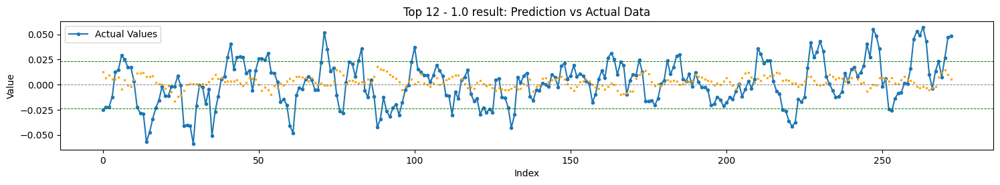

Total TH Pred.: 0


Top 13 - 1.0
RMSE: 0.023374, STD_DEV: 0.022020, STD_PRD: 0.004506, OBJDIFF: 0.010111, RDIFF: 0.001354
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022502, inv. diff> 0.009239
Trend accuracy       : 44.485
Trend up accuracy    : 25.517
Trend down accuracy  : 66.142


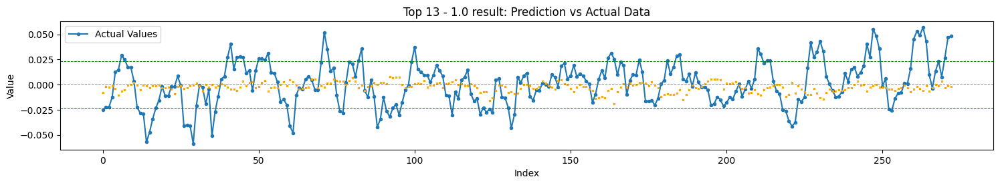

Total TH Pred.: 0


Top 14 - 1.0
RMSE: 0.023967, STD_DEV: 0.022020, STD_PRD: 0.005485, OBJDIFF: 0.010215, RDIFF: 0.001948
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023128, inv. diff> 0.009376
Trend accuracy       : 47.794
Trend up accuracy    : 13.103
Trend down accuracy  : 87.402


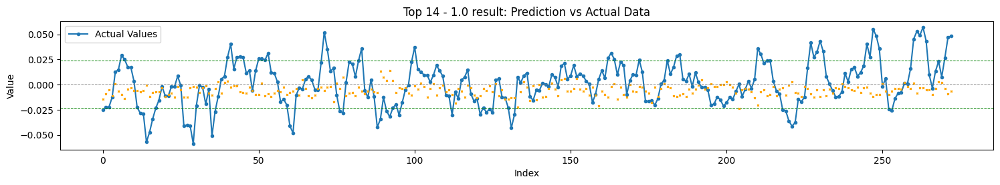

Total TH Pred.: 0


Top 15 - 1.0
RMSE: 0.022910, STD_DEV: 0.022020, STD_PRD: 0.003322, OBJDIFF: 0.010239, RDIFF: 0.000890
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022271, inv. diff> 0.009600
Trend accuracy       : 44.853
Trend up accuracy    : 28.276
Trend down accuracy  : 63.780


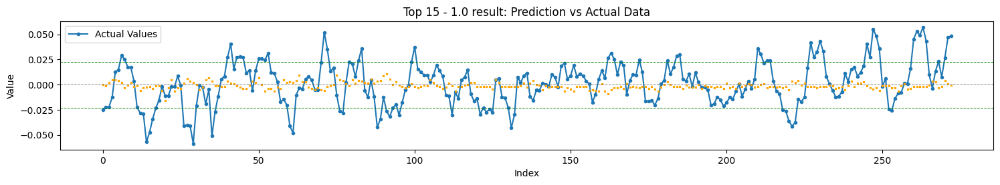

Total TH Pred.: 0


Top 16 - 1.0
RMSE: 0.023627, STD_DEV: 0.022020, STD_PRD: 0.004347, OBJDIFF: 0.010444, RDIFF: 0.001608
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022481, inv. diff> 0.009297
Trend accuracy       : 41.176
Trend up accuracy    : 21.379
Trend down accuracy  : 63.780


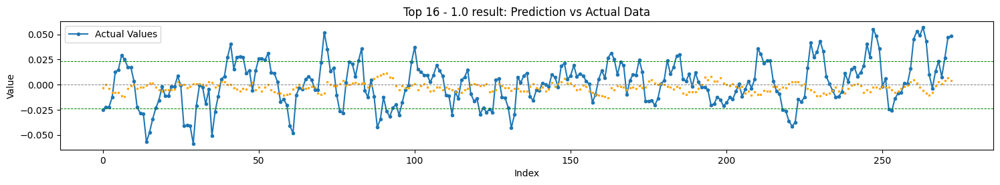

Total TH Pred.: 0


Top 17 - 1.0
RMSE: 0.022574, STD_DEV: 0.022020, STD_PRD: 0.002225, OBJDIFF: 0.010451, RDIFF: 0.000554
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022140, inv. diff> 0.010017
Trend accuracy       : 45.588
Trend up accuracy    : 13.793
Trend down accuracy  : 81.890


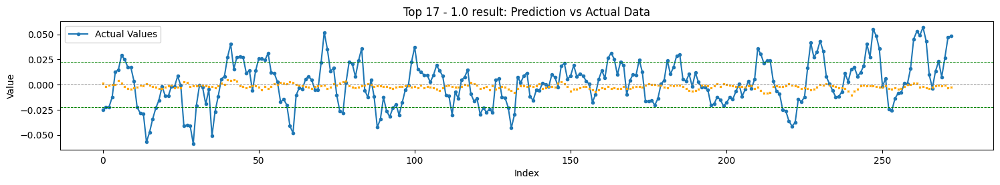

Total TH Pred.: 0


Top 18 - 1.0
RMSE: 0.022510, STD_DEV: 0.022020, STD_PRD: 0.001905, OBJDIFF: 0.010547, RDIFF: 0.000490
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022121, inv. diff> 0.010159
Trend accuracy       : 46.691
Trend up accuracy    : 7.586
Trend down accuracy  : 91.339


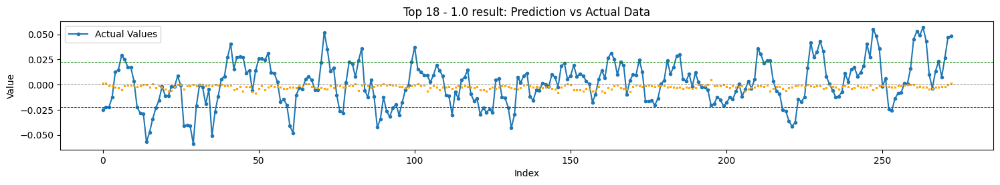

Total TH Pred.: 0


Top 19 - 1.0
RMSE: 0.023560, STD_DEV: 0.022020, STD_PRD: 0.003704, OBJDIFF: 0.010698, RDIFF: 0.001540
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022843, inv. diff> 0.009981
Trend accuracy       : 47.794
Trend up accuracy    : 5.517
Trend down accuracy  : 96.063


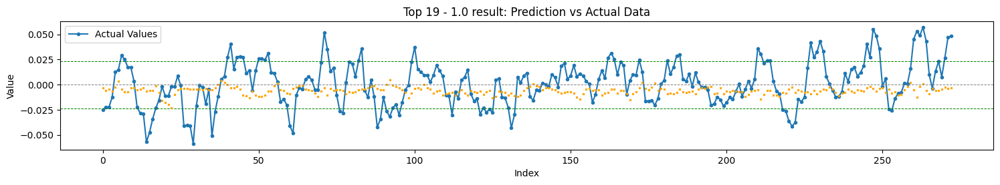

Total TH Pred.: 0


Top 20 - 1.0
RMSE: 0.025242, STD_DEV: 0.022020, STD_PRD: 0.006816, OBJDIFF: 0.010825, RDIFF: 0.003223
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023693, inv. diff> 0.009275
Trend accuracy       : 44.118
Trend up accuracy    : 11.034
Trend down accuracy  : 81.890


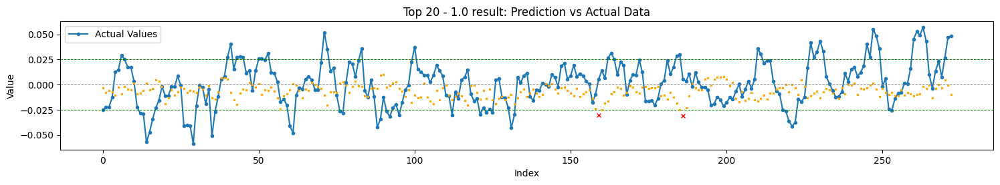

Total TH Pred.: 2
TH Pred. acc. : 0.00


Top 21 - 1.0
RMSE: 0.023026, STD_DEV: 0.022020, STD_PRD: 0.002252, OBJDIFF: 0.010890, RDIFF: 0.001006
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 3, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022331, inv. diff> 0.010195
Trend accuracy       : 44.853
Trend up accuracy    : 1.379
Trend down accuracy  : 94.488


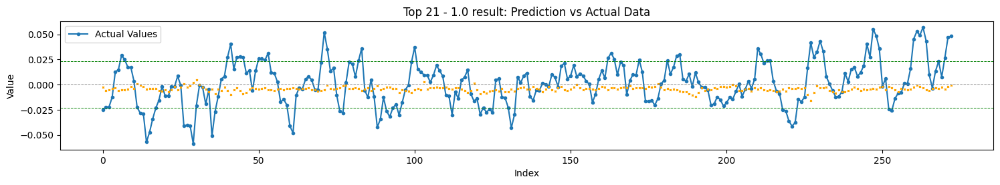

Total TH Pred.: 0


Top 22 - 1.0
RMSE: 0.023461, STD_DEV: 0.022020, STD_PRD: 0.002853, OBJDIFF: 0.011025, RDIFF: 0.001441
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 3, 'dense_units': 100, 'dense_activation': 'tanh', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022420, inv. diff> 0.009984
Trend accuracy       : 45.588
Trend up accuracy    : 1.379
Trend down accuracy  : 96.063


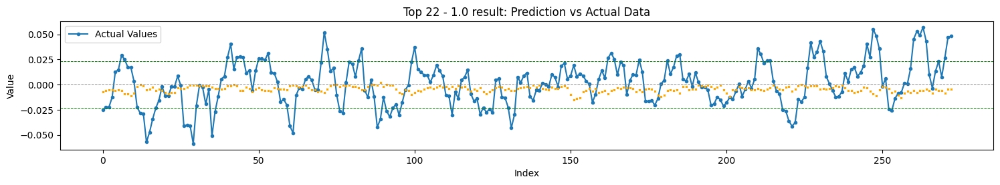

Total TH Pred.: 0


Top 23 - 1.0
RMSE: 0.023334, STD_DEV: 0.022020, STD_PRD: 0.002256, OBJDIFF: 0.011196, RDIFF: 0.001315
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 2, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'relu', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022606, inv. diff> 0.010468
Trend accuracy       : 45.588
Trend up accuracy    : 0.000
Trend down accuracy  : 97.638


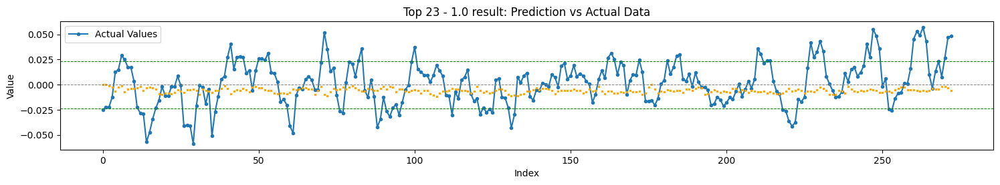

Total TH Pred.: 0


Top 24 - 1.0
RMSE: 0.026989, STD_DEV: 0.022020, STD_PRD: 0.009088, OBJDIFF: 0.011435, RDIFF: 0.004970
n_steps: 100, batch_size: 16, epochs: 100
Model params:  {'filters': 256, 'kernel_size': 2, 'pool_size': 4, 'dense_units': 100, 'dense_activation': 'relu', 'activation': 'tanh', 'dropout': 0.15}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAU', 'XAG', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.024486, inv. diff> 0.008932
Trend accuracy       : 42.279
Trend up accuracy    : 13.793
Trend down accuracy  : 74.803


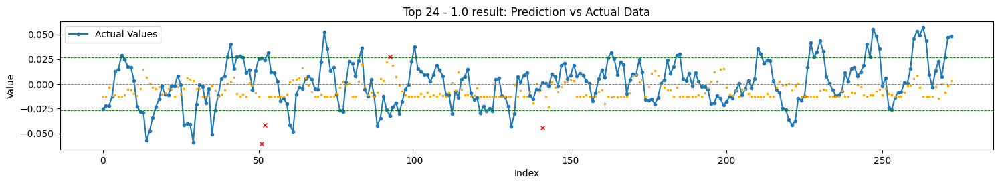

Total TH Pred.: 4
TH Pred. acc. : 0.00




In [21]:
for mult in [.5,.6,.7,.8,.9,1.0]:
    for i,result in enumerate(top_results_sort,1):

        # if result['rmse']-result['std_dev'] >= 0:
        #     continue

        print(f"Top {i} - {mult}")

        # if (result['rmse']<result['std_dev']):
        #     result['diff'] = result['rmse']-result['std_dev'] + abs(np.std(result['predictions']) - result['std_dev'])/4.0
        # else:
        #     result['diff'] = (result['rmse']- result['std_dev']) + abs(np.std(result['predictions']) - result['std_dev'])/2.0

        print("RMSE: {:.6f}, STD_DEV: {:.6f}, STD_PRD: {:.6f}, OBJDIFF: {:.6f}, RDIFF: {:.6f}".format(result['rmse'], result['std_dev'], np.std(result['predictions']), result['diff'],result['rmse']-result['std_dev']))
        print("n_steps: {}, batch_size: {}, epochs: {}".format(result['n_steps'], result['batch_size'], result['epochs']))
        # print("batch_size: {}, epochs: {}".format(result['batch_size'], result['epochs']))
        print("Model params: ", result['md_prm'])
        print("Feature list: ", result['feature_list'])

        # var_tot     = set(variable_options)
        # fea_list    = set(result['feature_list'])
        # print("Discarded var: {}".format(var_tot - fea_list))

        result['inv_rmse'] = inv_rmse = rmse(result['true_values'], result['predictions']*-1)
        inv_diff = (inv_rmse - result['std_dev']) + abs(np.std(result['predictions']) - result['std_dev'])/2.0
        print("Inv. rmse> {:.6f}, inv. diff> {:.6f}".format(inv_rmse, inv_diff))

        # calculate trend prediction percentage

        trend_up_true   = 0
        trend_down_true = 0
        trend_up_pred   = 0
        trend_down_pred = 0

        for j in range(len(result['true_values'])-1):
            if result['true_values'][j] > 0.0:
                trend_up_pred += 1
                if result['predictions'][j] > 0.0:
                    trend_up_true += 1
            if result['true_values'][j] < 0.0:
                trend_down_pred += 1
                if result['predictions'][j] < 0.0:
                    trend_down_true += 1

        trend_true      = trend_up_true + trend_down_true
        trend_pred      = trend_up_pred + trend_down_pred
        trend_accuracy  = trend_true/trend_pred
        print("Trend accuracy       : {:.3f}".format(trend_accuracy*100))
        print("Trend up accuracy    : {:.3f}".format(trend_up_true*100/trend_up_pred))
        print("Trend down accuracy  : {:.3f}".format(trend_down_true*100/trend_down_pred))


        tot_pred, prof, loss = plot_predictions(result['true_values'], result['predictions'],-1, title=f"Top {i} - {mult} result: Prediction vs Actual Data",rmse=result['rmse']*mult)
        print("Total TH Pred.: {}".format(tot_pred))
        if tot_pred != 0:
            print("TH Pred. acc. : {:.2f}".format(prof*100.0/tot_pred))
        print('\n')


In [22]:
"""
n_steps_options     = [15]
batch_size_options  = [16]
epochs_options      = [100]

filters_options         = [64, 128, 256]
kernel_size_options     = [2, 3, 5]
pool_size_options       = [1, 2]
dense_units_options     = [50, 100, 150]
# dense_activation_options = ['relu', 'tanh']
dense_activation_options = ['relu']
# activation_options      = ['relu', 'tanh']
activation_options      = ['relu']
dropout_options         = [0.1, 0.2, 0.3]
"""

"\nn_steps_options     = [15]\nbatch_size_options  = [16]\nepochs_options      = [100]\n\nfilters_options         = [64, 128, 256]\nkernel_size_options     = [2, 3, 5]\npool_size_options       = [1, 2]\ndense_units_options     = [50, 100, 150]\n# dense_activation_options = ['relu', 'tanh']\ndense_activation_options = ['relu']\n# activation_options      = ['relu', 'tanh']\nactivation_options      = ['relu']\ndropout_options         = [0.1, 0.2, 0.3]\n"